In [1]:
from jax.experimental.ode import odeint #gives the numerical solution to ode
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch import nn
import tqdm
from numpy.random import multivariate_normal
import jax
from torch.utils.data import DataLoader
from sklearn.gaussian_process.kernels import RBF
from scipy.stats import multivariate_normal as normal
from torch.optim.lr_scheduler import MultiStepLR
import scipy
import pandas as pd
from functools import partial
import functools
import time
import copy
import math
import filterpy
from filterpy.kalman import EnsembleKalmanFilter

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using {} device".format(device))

Using cuda device


In [3]:
class CustomDataset(torch.utils.data.Dataset):
  def __init__(self, u, y, s, batch_size=64):
    #data
    self.u=u
    self.y=y
    self.s=s

    #aux var
    self.N=len(u) #num of samples in data
    self.batch_size=batch_size

  def __len__(self): #returns num of samples in dataset
    return len(self.u)

  def __getitem__(self, index):
    ux = self.u[index]
    y= self.y[index]
    Ssamp = self.s[index]

    return ux, y, Ssamp

# Training Data

In [4]:
Kernel =RBF(0.2)

In [5]:
#By Warren Wecksser #https://scipy-cookbook.readthedocs.io/items/KdV.html
from scipy.integrate import odeint
from scipy.fftpack import diff as psdiff


def kdv_exact(x, c):
    """Profile of the exact solution to the KdV for a single soliton on the real line."""
    u = 0.5*c*np.cosh(0.5*np.sqrt(c)*x)**(-2)
    return u

def kdv(u, t, L):
    """Differential equations for the KdV equation, discretized in x."""
    # Compute the x derivatives using the pseudo-spectral method.
    ux = psdiff(u, period=L)
    uxxx = psdiff(u, period=L, order=3)

    # Compute du/dt.
    dudt = -6*u*ux - uxxx

    return dudt

def kdv_solution(u0, t, L):
    """Use odeint to solve the KdV equation on a periodic domain.

    `u0` is initial condition, `t` is the array of time values at which
    the solution is to be computed, and `L` is the length of the periodic
    domain."""

    sol = odeint(kdv, u0, t, args=(L,), mxstep=5000)
    return sol


# Set the initial conditions.
# Not exact for two solitons on a periodic domain, but close enough...
#"KdV The chosen initial condition, u(x, 0) is a sum of two solitons, i.e., u = u1+u2. A single soliton is a type of solitary wave" (Michalowska)


#u0 = kdv_exact(x-0.33*L, 0.95) + kdv_exact(x-0.65*L, 0.4)

In [6]:
# Set the size of the domain, and create the discretized grid.
L = 50.0
num_sensors = 100
dx = L / (num_sensors - 1.0)
# Set the time sample grid.
T = 500
M =1001

In [7]:
def kdv_solver(L, num_sensors, c, a, T, M):
    x = np.linspace(0, (1-1.0/num_sensors)*L, num_sensors)
    #"KdV The chosen initial condition, u(x, 0) is a sum of two solitons, i.e., u = u1+u2. A single soliton is a type of solitary wave" (Michalowska)
    #u0 = kdv_exact(x-0.33*L, 0.95) + kdv_exact(x-0.65*L, 0.4)
    u0 = kdv_exact(x-a[0]*L, c[0]) + kdv_exact(x-a[1]*L, c[1])

    t = np.linspace(0, T, M)
    sol = kdv_solution(u0, t, L)
    return sol

def create_sequences(data, seq_len):
    X, y = [], []
    for i in range(data.shape[0] - seq_len):
        X.append(data[ i:i+seq_len,:])
        y.append(data[ i+seq_len, :])
    return torch.tensor(np.array(X), dtype=torch.float32), torch.tensor(np.array(y), dtype=torch.float32)

In [ ]:
numIC=30
np.random.seed(420)
c = np.random.uniform(0.5, 1.0, size=(numIC, 2))
np.random.seed(3464)
a = np.random.uniform(0.0, 1.0, size=(numIC, 2))

In [ ]:
sol=[]
for i in tqdm.tqdm(range(len(c))):
    sol.append(kdv_solver(L, num_sensors, c[i], a[i], T, M))

100%|██████████| 10/10 [04:58<00:00, 29.82s/it]


In [ ]:
sol =np.array(sol)

In [ ]:
sol =10*sol

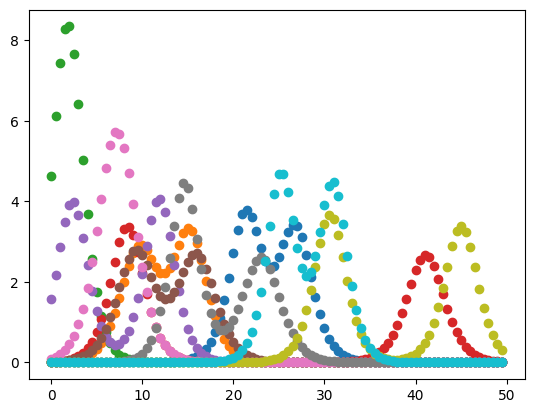

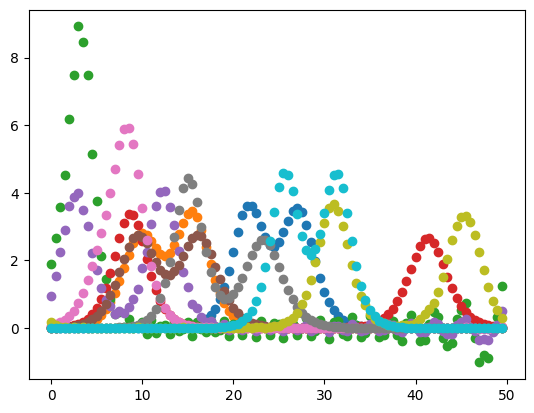

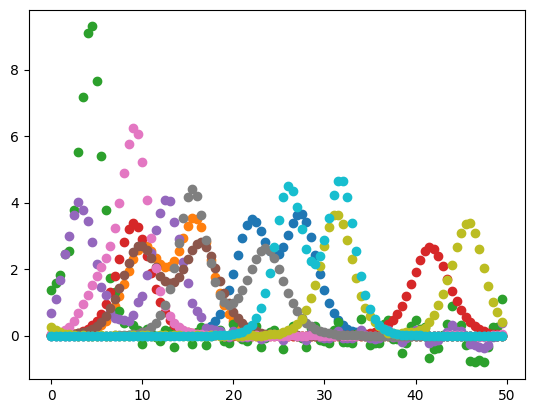

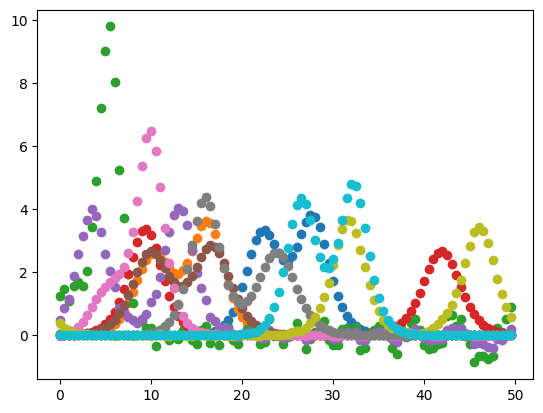

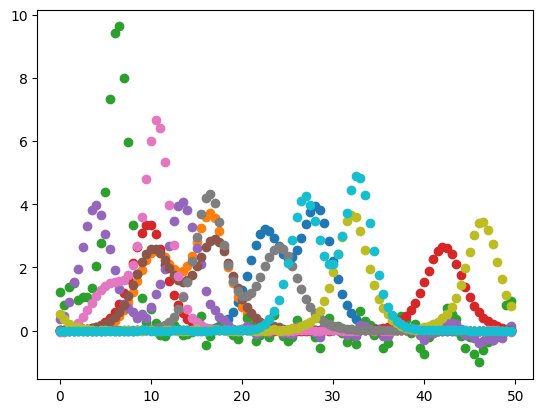

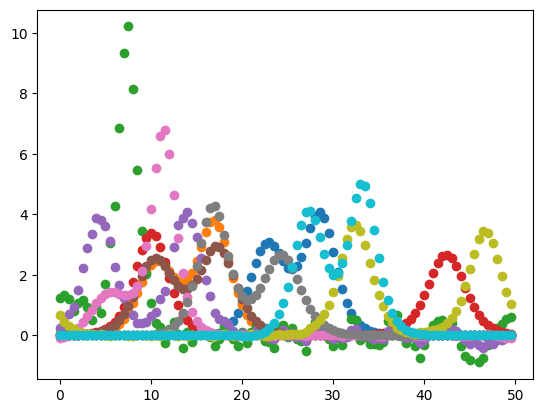

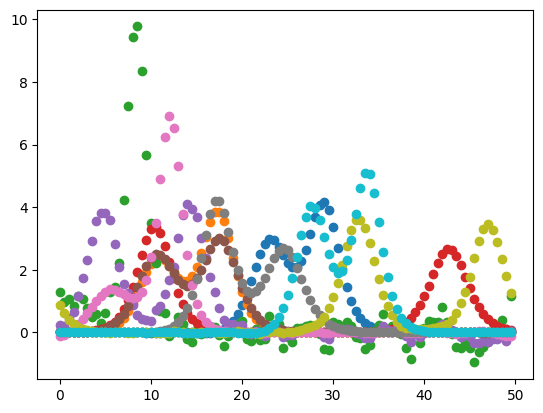

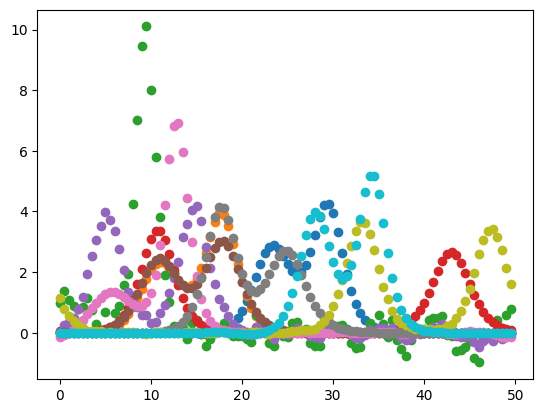

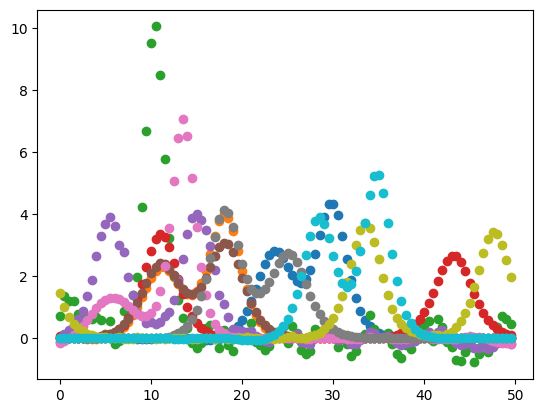

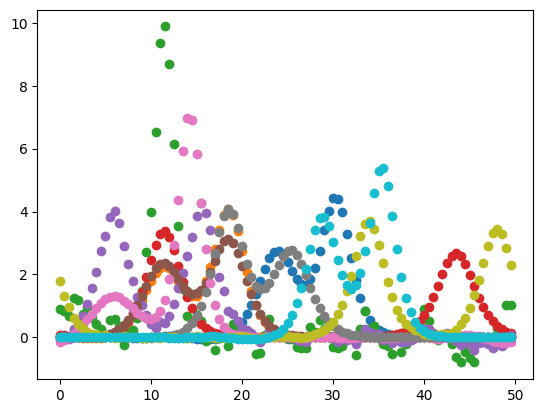

In [ ]:
#Waves move to the right
for i in range(10):
    for j in range(len(sol)):
      plt.scatter(np.linspace(0, (1-1.0/num_sensors)*L, num_sensors), sol[j,i,:])
    plt.show()

In [10]:
np.random.seed(908)
ctest = np.random.uniform(0.5, 1.0, size=(1, 2))
np.random.seed(69)
atest = np.random.uniform(0.0, 1.0, size=(1, 2))

In [11]:
sol_test = kdv_solver(L, num_sensors, ctest[0], atest[0], T, M)
sol_test = 10*sol_test

In [12]:
np.savetxt("TestIC.csv", sol_test, delimiter=',')

In [ ]:
sol_test = np.loadtxt("TestIC.csv", delimiter=',')

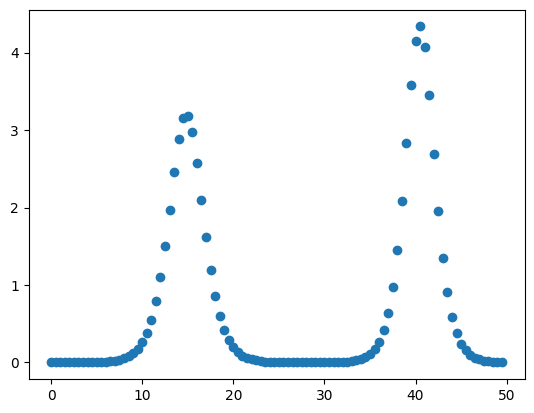

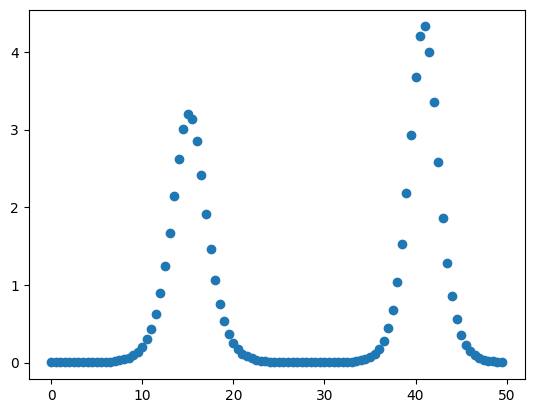

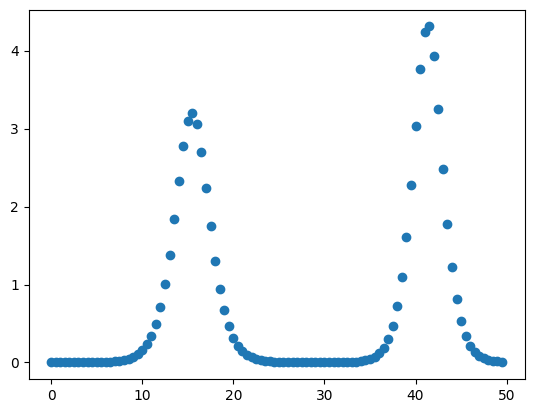

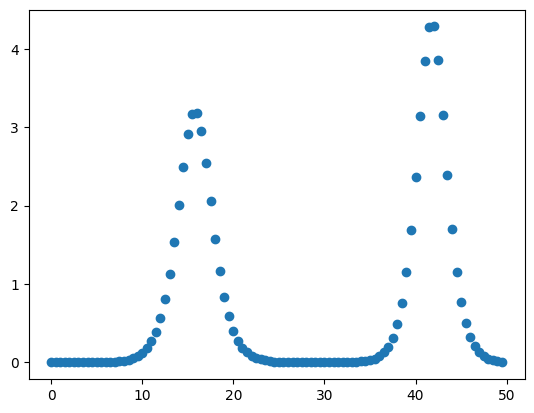

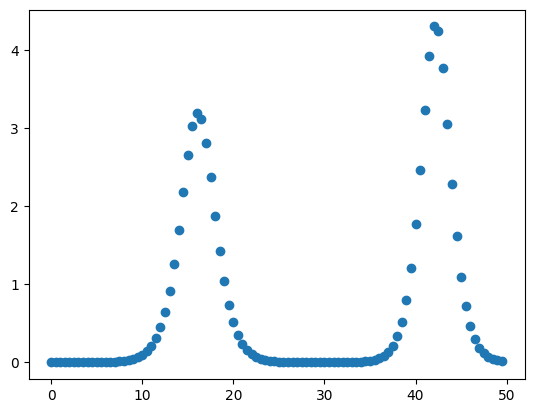

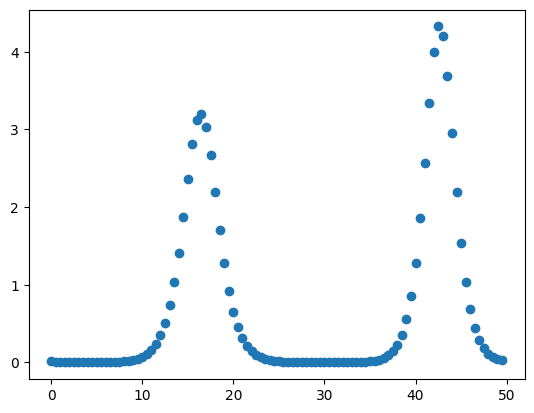

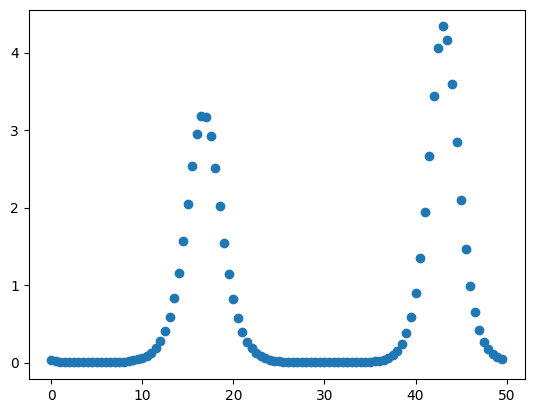

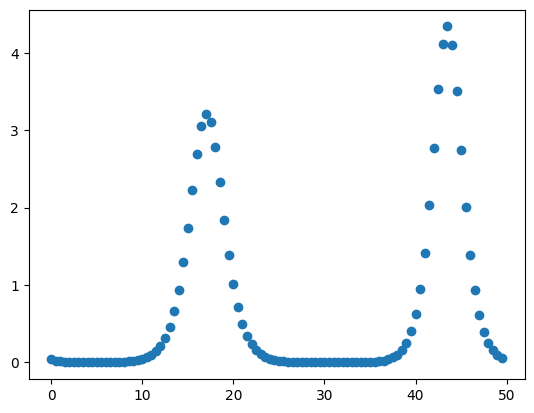

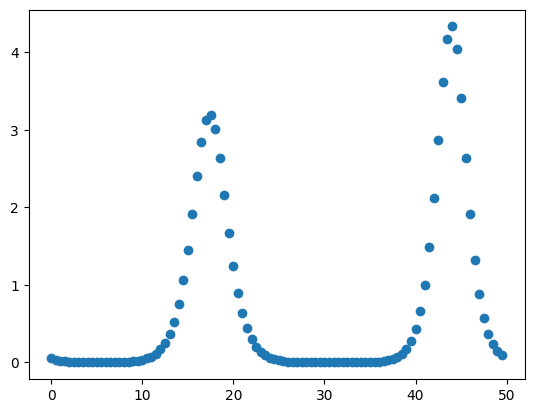

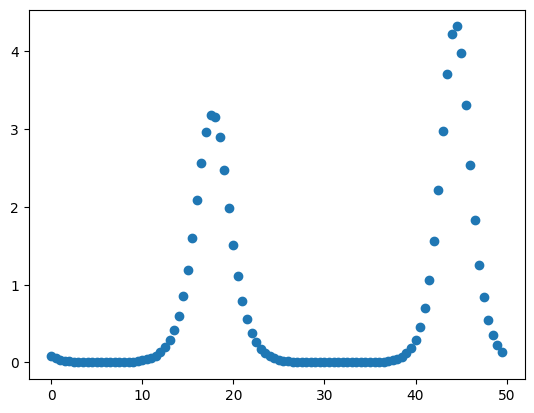

In [13]:
for i in range(10):
    plt.scatter(np.linspace(0, (1-1.0/num_sensors)*L, num_sensors), sol_test[i])
    plt.show()

In [8]:
LSTM_seq_len = 10
#test_data_input, test_data_output = create_sequences(sol_test, LSTM_seq_len)

In [ ]:
#LSTM_seq_len = 10
train_data_input=[]
train_data_output=[]
for i in range(numIC):
    iput, ouput = create_sequences(sol[i], LSTM_seq_len)
    train_data_input.append(iput)
    train_data_output.append(ouput)
train_data_input = torch.Tensor(np.array(train_data_input))
train_data_output = torch.Tensor(np.array(train_data_output))
#train_data_output = train_data_output.to(device)
#test_data_input, test_data_output = create_sequences(sol_test, LSTM_seq_len)

In [12]:
num_y_test =num_sensors
ytest=np.linspace(0, (1-1.0/num_sensors)*L, num_sensors) #sensors are same as trunk net input
ytest2 = np.reshape(ytest, (num_y_test, 1) )

#u_train2 = np.repeat(train_data_input, num_y_test, axis=0)
#y_train= np.tile(ytest2, (len(train_data_input),1))

#u_test2 =np.repeat(test_data_input, num_y_test, axis=0)
y_test =np.tile(ytest2, (len(test_data_input),1))

In [16]:
#S_train = train_data_output.reshape((len(train_data_output)*len(train_data_output[0]),1))
S_test= test_data_output.reshape((len(test_data_output)*len(test_data_output[0]),1))

In [17]:
#uarr =np.copy(u_train2)
#trainingUx = torch.Tensor(uarr).to(device) #functions, input into branch net

#trainingY= torch.Tensor(y_train).to(device) #sensors for operator, input to trunk

#sarr = np.copy(S_train)
#trainingS = torch.Tensor(sarr).to(device) #operator output at input y, (ie. numerical integral result)

#print("U(x): ", np.shape(trainingUx), " Y: ", np.shape(trainingY), " S: ", np.shape(trainingS))

testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net

testingY= torch.Tensor(np.array(y_test)).to(device) #sensors for operator, input to trunk

testingS = torch.Tensor(np.array(S_test)).to(device) #operator output at input y, (ie. numerical integral result)

print("U(x): ", np.shape(testingUx), " Y: ", np.shape(testingY), " S: ", np.shape(testingS))


#batch_size=500 #len(trainingUx) #no batches in example
#dataset = CustomDataset(trainingUx, trainingY, trainingS, batch_size)
#dataloader = DataLoader(dataset, batch_size, shuffle=True) #the deepONet in deepxde shuffles the data between epochs

U(x):  torch.Size([99100, 10, 100])  Y:  torch.Size([99100, 1])  S:  torch.Size([99100, 1])


In [8]:
sol_test2d = np.loadtxt("fortyICtest.csv", delimiter=',')
sol_test= sol_test2d.reshape(len(sol_test2d), 1001, 100)

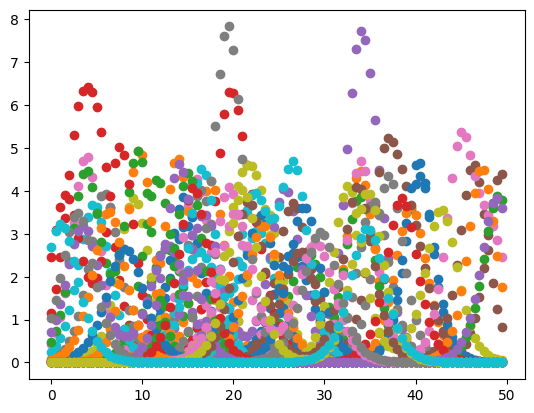

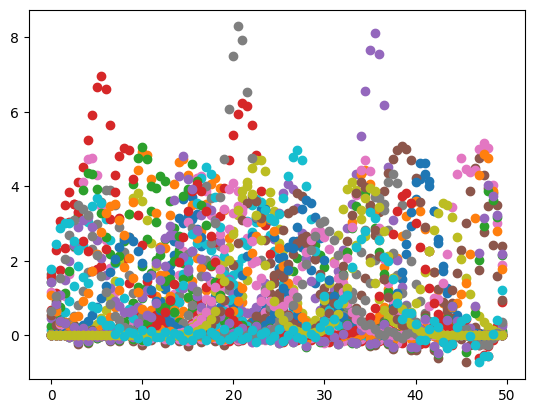

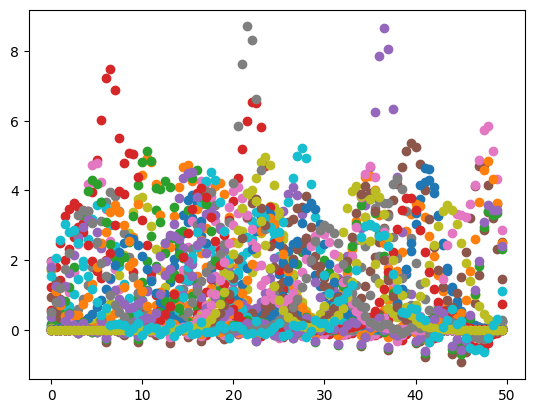

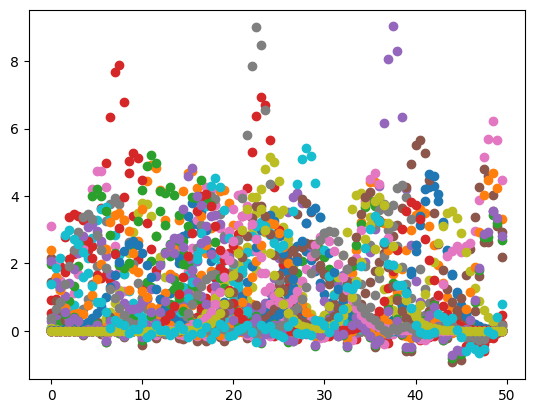

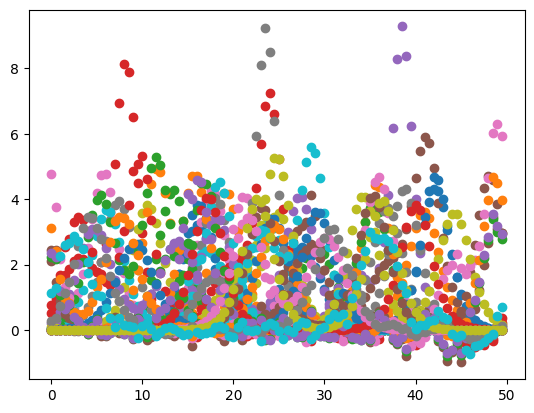

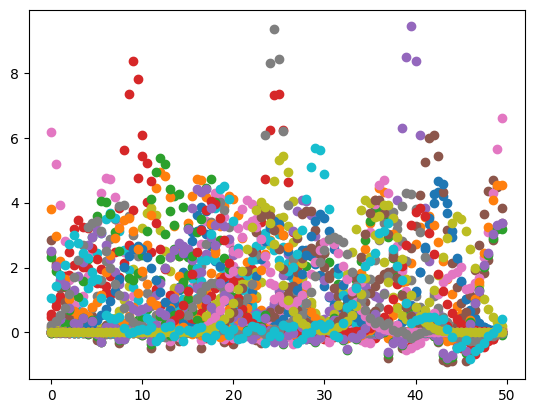

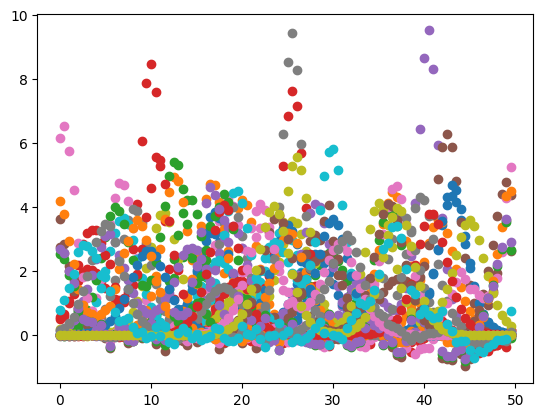

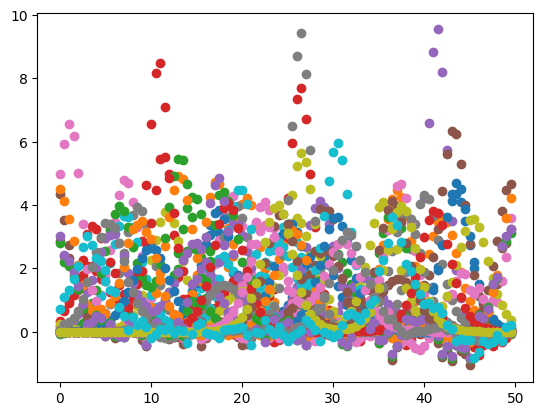

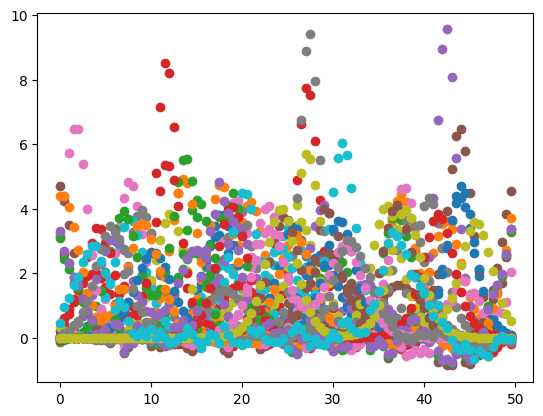

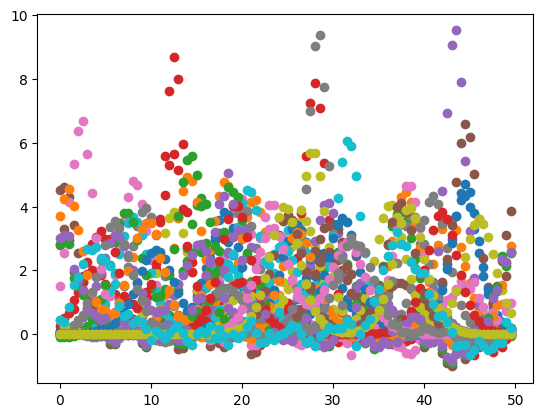

In [9]:
#Waves move to the right
for i in range(10):
    for j in range(len(sol_test)):
      plt.scatter(np.linspace(0, (1-1.0/num_sensors)*L, num_sensors), sol_test[j,i,:])
    plt.show()

In [10]:
numICtest=40
LSTM_seq_len = 10

In [11]:
test_data_input=[]
test_data_output=[]
for i in range(numICtest):
    iput, ouput = create_sequences(sol_test[i], LSTM_seq_len)
    test_data_input.append(iput)
    test_data_output.append(ouput)
test_data_input = torch.Tensor(np.array(test_data_input))
test_data_output = torch.Tensor(np.array(test_data_output))

# Model

In [13]:
class LSTMModel(nn.Module):
    def __init__(self, input_dim=100, hidden_dim=64, num_layers=3):
        super().__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, input_dim)

    def forward(self, x):
        out, _ = self.lstm(x)
        last_hidden = out[:, -1, :]
        return self.fc(last_hidden)

In [14]:
class DeepONet(nn.Module):
  def __init__(self, numhiddens_B, numhiddens_T):
    #numhiddens_B should be list of ints, the sizes of each branch net hidden layer
    #numhiddens_T should be list of ints, the sizes of each trunk net hidden layer
    super(DeepONet, self).__init__()

    #assert numhiddens_B[-1]==numhiddens_T[-1], "Branch/Trunk outputs are different"

    #self.BranchLayers =nn.ModuleList([nn.Linear(numhiddens_B[0], numhiddens_B[1])])
    #for i in range(1, len(numhiddens_B)-1):
      #self.BranchLayers.append(nn.Linear(numhiddens_B[i], numhiddens_B[i+1]))

    self.BranchNet = LSTMModel()

    self.TrunkLayers =nn.ModuleList([nn.Linear(numhiddens_T[0], numhiddens_T[1])])
    for i in range(1, len(numhiddens_T)-1):
      self.TrunkLayers.append(nn.Linear(numhiddens_T[i], numhiddens_T[i+1]))

    #self.bias = torch.nn.parameter.Parameter(torch.tensor([0.0,0.0])) #need to set the bias as a parameter so it will be trained with the model

    self.relu=nn.ReLU()

  def forward(self, u, y): #u is branch net input, y is trunknet input
    #branchout = self.BranchLayers[0](u)
    #for i in range(1, len(self.BranchLayers)):
      #branchout = self.relu(branchout)
      #branchout = self.BranchLayers[i](branchout)

    branchout =  self.BranchNet(u)

    trunkout = self.TrunkLayers[0](y)
    for i in range(1, len(self.TrunkLayers)):
      trunkout = self.relu(trunkout)
      trunkout = self.TrunkLayers[i](trunkout)

    sum=torch.einsum('bi, bi -> b',  branchout, trunkout)

    sum=torch.unsqueeze(sum, 1)
    #sum += self.bias # need to add the bias here to mimic the paper

    return sum

In [15]:
#milestones2=[1000, 1500, 2000, 2500, 3000, 3500, 4000, 4500]
milestones1=[5000]
model4=DeepONet([30, 64], [1, 64, 100, 100]).to(device)
optimizer4=torch.optim.Adam(model4.parameters(), lr=0.001) # they use 0.001 in tutorial at first
scheduler4 = torch.optim.lr_scheduler.MultiStepLR(optimizer4, milestones=milestones1, gamma=0.9)
loss_fn = nn.MSELoss()

# EnKF (single test)

In [15]:
model4.load_state_dict(torch.load('LSTM+DeepONet_thirtyIC.pth', weights_only=True))
model4.eval().to(device)

DeepONet(
  (BranchNet): LSTMModel(
    (lstm): LSTM(100, 64, num_layers=3, batch_first=True)
    (fc): Linear(in_features=64, out_features=100, bias=True)
  )
  (TrunkLayers): ModuleList(
    (0): Linear(in_features=1, out_features=64, bias=True)
    (1): Linear(in_features=64, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=100, bias=True)
  )
  (relu): ReLU()
)

In [16]:
import ensemble_kalman_filter_LSTM
from ensemble_kalman_filter_LSTM import *

In [17]:
dim_x=100
N_step = 991
time_step = 1

ensemble_size = 100
obs_sigma = 0.1
forward_error = 0.05
model_inher =0.05 #just set it to approximately the same for now

obs_gap=20
consecutive_obs=15
device

'cuda'

In [18]:
def EnKF_forward_DeepONet(x_state, x_state_queue, dt):
    torch_x = torch.from_numpy(x_state).reshape([ensemble_size, 1, dim_x]).to(torch.float).to(device)
    torch_queue = torch.from_numpy(x_state_queue.reshape(ensemble_size, LSTM_seq_len-1, dim_x)).to(torch.float).to(device)
    #torch_queue = torch.from_numpy(x_state_queue.reshape(ensemble_size, LSTM_seq_len, dim_x)).to(torch.float).to(device)
    #next_t = model(torch.cat([torch_queue, torch_x], dim = 1)).detach().cpu().numpy()

    x_state_queue2 = torch.repeat_interleave(torch.cat([torch_queue, torch_x], dim = 1), num_y_test, dim=0)
    x_state = model4(x_state_queue2, ensf_y).reshape([ensemble_size, dim_x]).detach().cpu().numpy()
    #next_t = model(torch.cat([torch_queue, torch_x], dim = 1)).detach().cpu().numpy()

    return x_state

In [19]:
def hx_id(x):
    #return x/2
    return np.atan(x)

In [20]:
mse_all=[]

In [110]:
for i in range(1):
    num_y_test =num_sensors
    ytest=np.linspace(0, (1-1.0/num_sensors)*L, num_sensors) #sensors are same as trunk net input
    ytest2 = np.reshape(ytest, (num_y_test, 1) )
    #u_test2 =np.repeat(test_data_input[i], num_y_test, axis=0)
    #y_test =np.tile(ytest2, (len(test_data_input[i]),1))
    
    #S_test= test_data_output[i].reshape((len(test_data_output[i])*len(test_data_output[i][0]),1))
    #testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net
    #testingY= torch.Tensor(np.array(y_test)).to(device) #sensors for operator, input to trunk
    #testingS = torch.Tensor(np.array(S_test)).to(device) #operator output at input y, (ie. numerical integral result)

    test_data_ensf = torch.tensor(test_data_output[i], dtype=torch.float32).to(device)
    x_state_queue = test_data_input[i][0][: LSTM_seq_len - 1].reshape((LSTM_seq_len-1, num_sensors))
    initial_state =x_state_queue[-1].numpy()

    ensf_y =torch.Tensor(np.tile(ytest2,  (ensemble_size,1))).to(device)
    covariance_matrix = np.eye(dim_x) * 100
    f = ensemble_kalman_filter_LSTM.EnsembleKalmanFilter(x = initial_state, P = covariance_matrix, dim_z = dim_x, dt = time_step,
                                                         N = ensemble_size, hx = hx_id, fx = EnKF_forward_DeepONet,
                                                         ensemble_size = ensemble_size, LSTM_seq_len = LSTM_seq_len,
                                                         x_queue = x_state_queue)


    f.R *= obs_sigma #** 2
    #f.Q *= (forward_error ** 2 + model_inher)
    f.Q *= forward_error #(forward_error  +model_inher)
    y_state = []
    rmse_temp = []
    for j in tqdm.tqdm(range(N_step)):
        #z = np.concatenate((np.zeros((LSTM_seq_len - 1) * dim_x), sol[i]), axis = None)
        #z = np.atan(sol[i]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)#MUST apply obs to true state, since not done in
        #z = sol[i]/2 + np.random.multivariate_normal(np.zeros(dim_x), f.R)
        if j % obs_gap == 0:
          do_obs = consecutive_obs
        if not(do_obs):
            z= None
        if do_obs:
            z = np.atan(test_data_output[i][j]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)
        f.predict()
        f.update(z)
        y_state.append(f.x[-dim_x: ])
        rmse_temp.append(torch.sqrt(torch.mean((torch.Tensor(y_state[-1]) - test_data_output[i][j]) ** 2)).item())
    y_state = np.array(y_state)
    mse_all.append(rmse_temp)

/tmp/ipykernel_3059535/1869758652.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_data_ensf = torch.tensor(test_data_output[i], dtype=torch.float32).to(device)
  0%|          | 0/991 [00:00<?, ?it/s]/tmp/ipykernel_3059535/1869758652.py:39: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  z = np.atan(test_data_output[i][j]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)
100%|██████████| 991/991 [00:59<00:00, 16.75it/s]


In [113]:
np.savetxt("y_state_EnKF.csv", y_state, delimiter=',')

In [21]:
y_state = np.loadtxt('y_state_EnKF.csv', delimiter=',')

In [22]:
x_states = np.loadtxt('x_states_True_IC1.csv', delimiter=',')

In [39]:
test_data_ensf = torch.tensor(test_data_output, dtype=torch.float32).to(device)

/tmp/ipykernel_4034564/2897839806.py:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_data_ensf = torch.tensor(test_data_output, dtype=torch.float32).to(device)


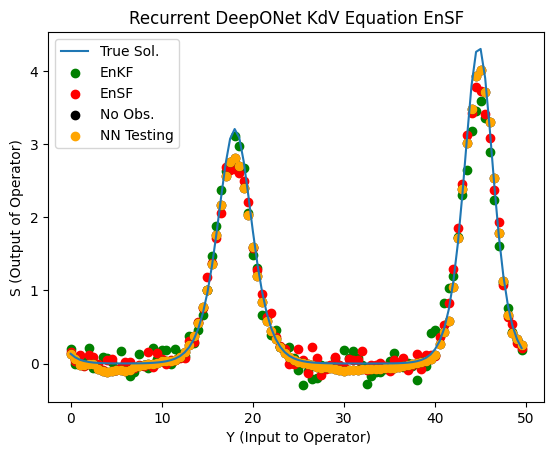

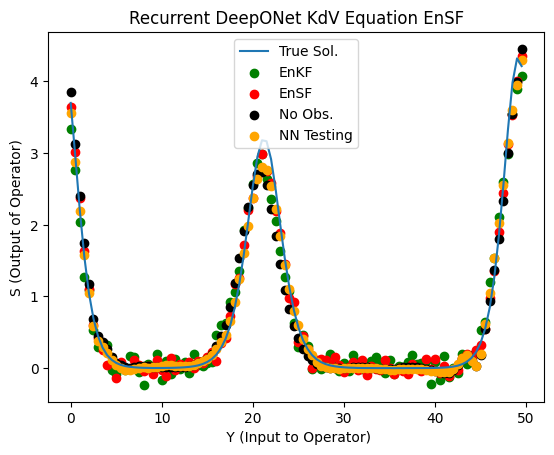

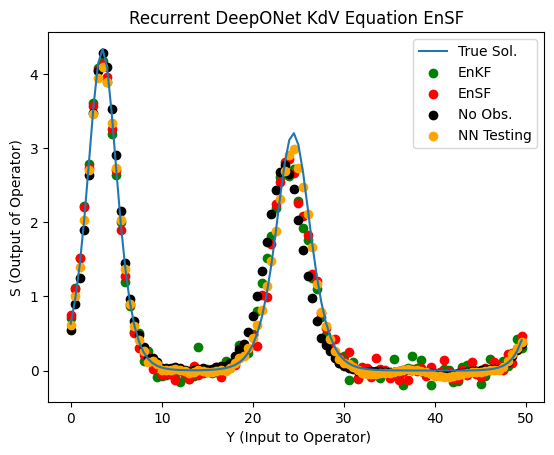

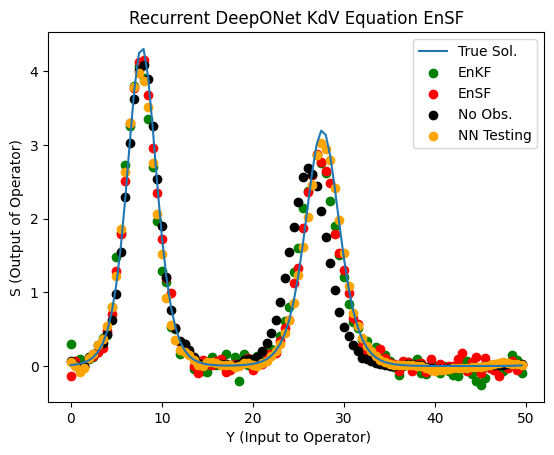

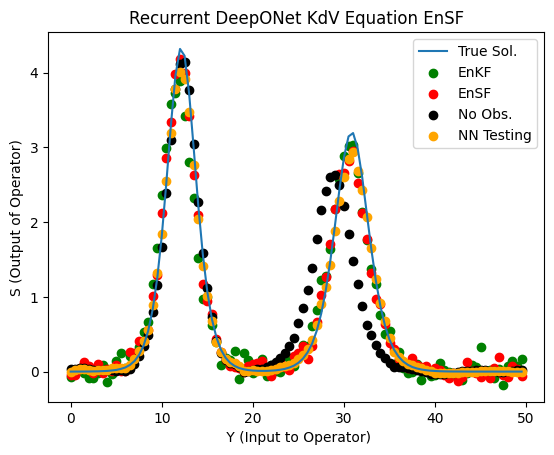

...

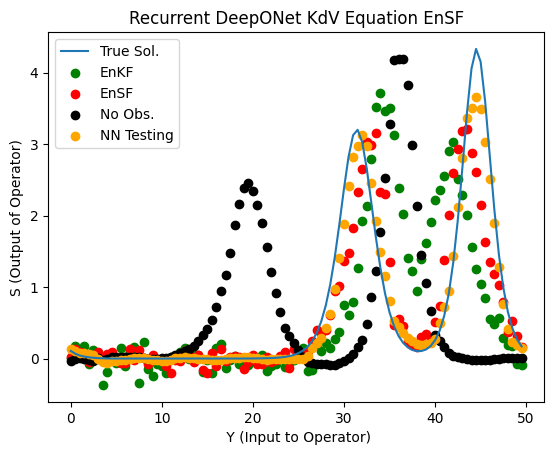

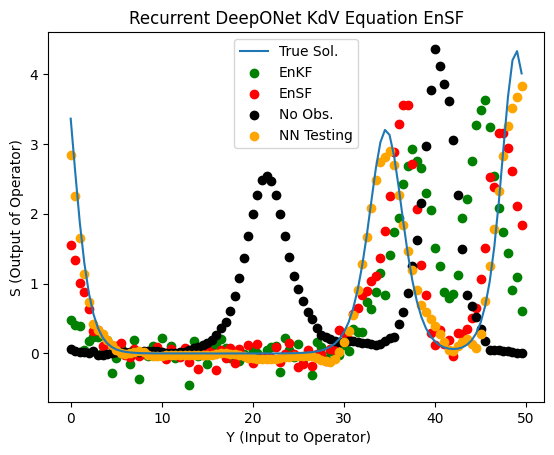

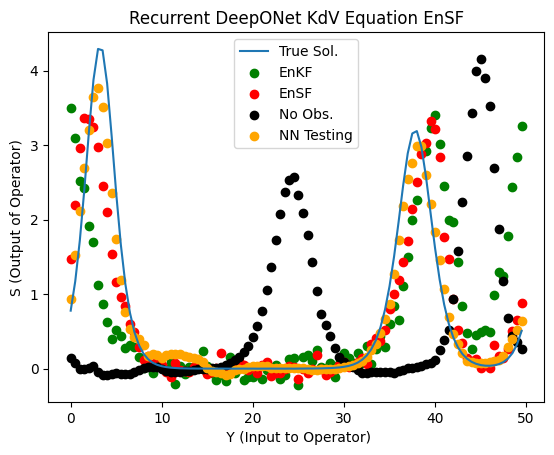

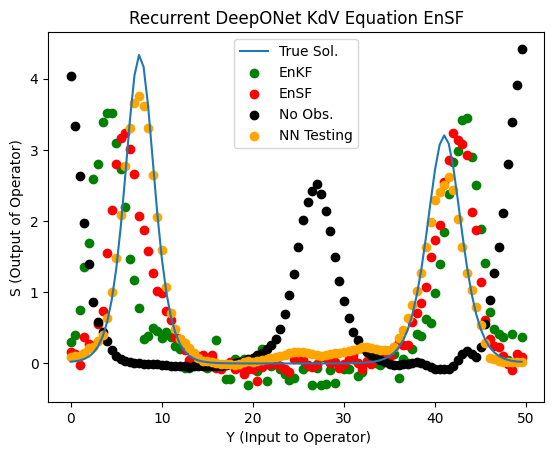

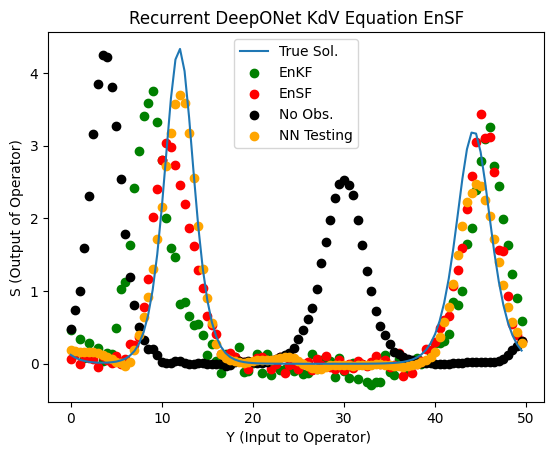

In [40]:
s_pred2 = s_pred.reshape(np.shape(x_states))
for n in range(60):
  plt.figure()
  plt.plot(ytest, test_data_ensf[0][n*10].cpu(), label='True Sol.')
  plt.scatter(ytest,y_state[n*10] , label='EnKF', color='green')
  plt.scatter(ytest, x_states[n*10], label='EnSF', color='red')
  plt.scatter(ytest, np.array(pred)[n*10], label='No Obs.', color='Black')
  plt.scatter(ytest, s_pred2[n*10], label='NN Testing', color='orange')
  plt.ylabel('S (Output of Operator)')
  plt.legend()
  plt.xlabel(' Y (Input to Operator)')
  plt.title('Recurrent DeepONet KdV Equation EnSF')
  plt.show()

In [27]:
mse_all = np.loadtxt("rmse_all_acc_EnKF.csv", delimiter=',')

In [28]:
mse_avg_EnKF = np.average(mse_all, axis=0)

In [29]:
np.average(mse_all)

np.float64(0.5901795609507383)

In [30]:
ytest2 = np.reshape(ytest, (num_y_test, 1) )

In [31]:
model4.eval().to(device)
rmse_temp_big=[]
for i in range(1):
    rmse_temp_fifo=[]
    pred=[]
    x_state_queue = test_data_input[i][0].reshape((1,LSTM_seq_len, num_sensors)).to(device)
    #print(np.shape(x_state_queue))
    #ensf_y = torch.Tensor(np.tile(ytest2,  (ensemble_size,1))).to(device)
    ensf_y =torch.Tensor(ytest2).to(device)
    for j in range(len(test_data_input[0])):
      if j !=0:
         x_state_queue = torch.cat((x_state_queue[:, 1:LSTM_seq_len, :], x_state.reshape((1,1,num_sensors))), dim=1)

      x_state_queue2 = torch.repeat_interleave(x_state_queue, num_y_test, dim=0)
      x_state = model4(x_state_queue2, ensf_y).detach()
      #plt.figure()
      #plt.plot(ensf_y.cpu(), test_data_output[i][j].cpu().numpy(), label='true sol')
      #plt.scatter(ensf_y.cpu(), x_state.cpu(), label='no DA', color='yellow')
     # plt.show()

      rmse_temp_fifo.append(torch.sqrt(torch.mean((x_state.detach().cpu() - test_data_output[i][j].unsqueeze(dim=-1)) ** 2)).item())
      #x_state = x_state + torch.randn_like(x_state) * 0.1
      pred.append(x_state.cpu().numpy())
      #x_state = x_state + torch.randn_like(x_state) * 0.1
    rmse_temp_big.append(rmse_temp_fifo)

In [32]:
np.average(rmse_temp_big)

np.float64(1.348314128297369)

In [33]:
model4.eval().cpu()
NN_testing_rmse = []
num_y_test =num_sensors
ytest=np.linspace(0, (1-1.0/num_sensors)*L, num_sensors) #sensors are same as trunk net input
ytest2 = np.reshape(ytest, (num_y_test, 1) )
s_preds = []

for i in range(1):
    u_test2 =np.repeat(test_data_input[i], num_y_test, axis=0)
    y_test =np.tile(ytest2, (len(test_data_input[i]),1))
    
    #S_test= test_data_output[i].reshape((len(test_data_output[i])*len(test_data_output[i][0]),1))
    testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net
    testingY= torch.Tensor(np.array(y_test)).to(device) #sensors for operator, input to trunk
    #testingS = torch.Tensor(np.array(S_test)).to(device) #operator output at input y, (ie. numerical integral result)
    s_pred = model4(testingUx.cpu(), testingY.cpu()).detach().cpu().reshape(991, 100)
    s_preds.append(s_pred)
    #print(np.shape(s_pred))
    NN_testing_rmse.append(torch.sqrt(torch.mean((s_pred - test_data_output[i]) ** 2, axis=1)))

/tmp/ipykernel_4034564/1462180821.py:13: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net


In [41]:
np.average(NN_testing_rmse)

np.float32(0.14707492)

In [42]:
NN_testing_rmse_2 = np.average(NN_testing_rmse, axis=0)

In [43]:
mse_avg_EnSF = np.loadtxt("rmse_all_acc.csv", delimiter=',')

In [44]:
mse_all = np.loadtxt("rmse_all_acc_EnKF.csv", delimiter=',')
mse_avg_EnKF = np.average(mse_all, axis=0)

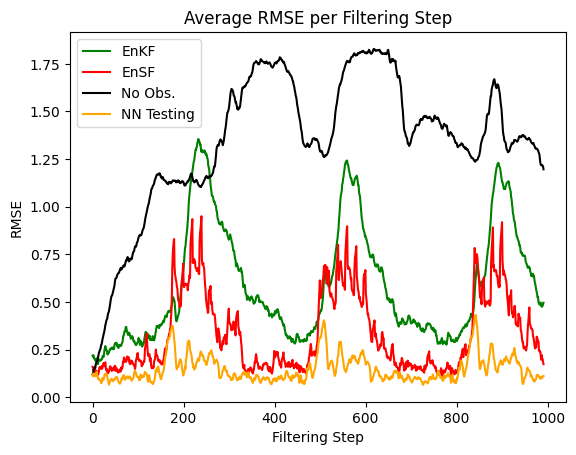

In [46]:
plt.plot(np.linspace(0, len(mse_avg_EnKF), len(mse_avg_EnKF)), mse_avg_EnKF, label="EnKF", color='green')
plt.plot(np.linspace(0, len(mse_avg_EnSF), len(mse_avg_EnSF)), mse_avg_EnSF, label="EnSF", color='red')
plt.plot(np.linspace(0, len(rmse_temp_fifo), len(rmse_temp_fifo)), np.average(rmse_temp_big, axis=0), label="No Obs.", color='black')
plt.plot(np.linspace(0, len(NN_testing_rmse_2), len(NN_testing_rmse_2)), NN_testing_rmse_2, label="NN Testing", color='orange')
plt.legend()
plt.title("Average RMSE per Filtering Step")
plt.ylabel("RMSE")
plt.xlabel('Filtering Step')
plt.show()

# EnKF

In [47]:
model4.load_state_dict(torch.load('LSTM+DeepONet_thirtyIC.pth', weights_only=True))
model4.eval().to(device)

DeepONet(
  (BranchNet): LSTMModel(
    (lstm): LSTM(100, 64, num_layers=3, batch_first=True)
    (fc): Linear(in_features=64, out_features=100, bias=True)
  )
  (TrunkLayers): ModuleList(
    (0): Linear(in_features=1, out_features=64, bias=True)
    (1): Linear(in_features=64, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=100, bias=True)
  )
  (relu): ReLU()
)

In [48]:
import ensemble_kalman_filter_LSTM
from ensemble_kalman_filter_LSTM import *

In [18]:
#test_data_ensf = torch.tensor(test_data_output, dtype=torch.float32).to(device)

In [49]:
dim_x=100
N_step = 991
time_step = 1

ensemble_size = 100
obs_sigma = 0.1
forward_error = 0.05
model_inher =0.05 #just set it to approximately the same for now

obs_gap=20
consecutive_obs=15
device

'cuda'

In [50]:
def EnKF_forward_DeepONet(x_state, x_state_queue, dt):
    torch_x = torch.from_numpy(x_state).reshape([ensemble_size, 1, dim_x]).to(torch.float).to(device)
    torch_queue = torch.from_numpy(x_state_queue.reshape(ensemble_size, LSTM_seq_len-1, dim_x)).to(torch.float).to(device)
    #torch_queue = torch.from_numpy(x_state_queue.reshape(ensemble_size, LSTM_seq_len, dim_x)).to(torch.float).to(device)
    #next_t = model(torch.cat([torch_queue, torch_x], dim = 1)).detach().cpu().numpy()

    x_state_queue2 = torch.repeat_interleave(torch.cat([torch_queue, torch_x], dim = 1), num_y_test, dim=0)
    x_state = model4(x_state_queue2, ensf_y).reshape([ensemble_size, dim_x]).detach().cpu().numpy()
    #next_t = model(torch.cat([torch_queue, torch_x], dim = 1)).detach().cpu().numpy()

    return x_state

In [51]:
def hx_id(x):
    #return x/2
    return np.atan(x)

In [ ]:
x_state_queue = test_data_input[0][: LSTM_seq_len - 1].reshape((LSTM_seq_len-1, num_sensors))
initial_state =x_state_queue[-1].numpy()

ensf_y =torch.Tensor(np.tile(ytest2,  (ensemble_size,1))).to(device)
#x_state_queue = test_data_input[0].reshape((1,LSTM_seq_len, num_sensors))
#for i in range(ensemble_size-1):
    #x_state_queue=torch.cat((x_state_queue, test_data_input[0].reshape((1,LSTM_seq_len, num_sensors))), dim=0)

#initial_state =x_state_queue[-1][-1].numpy()

In [ ]:
#initial_state = sol[LSTM_seq_len - 1]
#initial_queue = sol[: LSTM_seq_len - 1]
covariance_matrix = np.eye(dim_x) * 100
f = ensemble_kalman_filter_LSTM.EnsembleKalmanFilter(x = initial_state, P = covariance_matrix, dim_z = dim_x, dt = time_step,
                                                     N = ensemble_size, hx = hx_id, fx = EnKF_forward_DeepONet,
                                                     ensemble_size = ensemble_size, LSTM_seq_len = LSTM_seq_len,
                                                     x_queue = x_state_queue)

In [23]:
mse_all=[]

In [24]:
for i in range(40):
    num_y_test =num_sensors
    ytest=np.linspace(0, (1-1.0/num_sensors)*L, num_sensors) #sensors are same as trunk net input
    ytest2 = np.reshape(ytest, (num_y_test, 1) )
    #u_test2 =np.repeat(test_data_input[i], num_y_test, axis=0)
    #y_test =np.tile(ytest2, (len(test_data_input[i]),1))
    
    #S_test= test_data_output[i].reshape((len(test_data_output[i])*len(test_data_output[i][0]),1))
    #testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net
    #testingY= torch.Tensor(np.array(y_test)).to(device) #sensors for operator, input to trunk
    #testingS = torch.Tensor(np.array(S_test)).to(device) #operator output at input y, (ie. numerical integral result)

    test_data_ensf = torch.tensor(test_data_output[i], dtype=torch.float32).to(device)
    x_state_queue = test_data_input[i][0][: LSTM_seq_len - 1].reshape((LSTM_seq_len-1, num_sensors))
    initial_state =x_state_queue[-1].numpy()

    ensf_y =torch.Tensor(np.tile(ytest2,  (ensemble_size,1))).to(device)
    covariance_matrix = np.eye(dim_x) * 100
    f = ensemble_kalman_filter_LSTM.EnsembleKalmanFilter(x = initial_state, P = covariance_matrix, dim_z = dim_x, dt = time_step,
                                                         N = ensemble_size, hx = hx_id, fx = EnKF_forward_DeepONet,
                                                         ensemble_size = ensemble_size, LSTM_seq_len = LSTM_seq_len,
                                                         x_queue = x_state_queue)


    f.R *= obs_sigma #** 2
    #f.Q *= (forward_error ** 2 + model_inher)
    f.Q *= forward_error #(forward_error  +model_inher)
    y_state = []
    rmse_temp = []
    for j in tqdm.tqdm(range(N_step)):
        #z = np.concatenate((np.zeros((LSTM_seq_len - 1) * dim_x), sol[i]), axis = None)
        #z = np.atan(sol[i]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)#MUST apply obs to true state, since not done in
        #z = sol[i]/2 + np.random.multivariate_normal(np.zeros(dim_x), f.R)
        if j % obs_gap == 0:
          do_obs = consecutive_obs
        if not(do_obs):
            z= None
        if do_obs:
            z = np.atan(test_data_output[i][j]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)
        f.predict()
        f.update(z)
        y_state.append(f.x[-dim_x: ])
        rmse_temp.append(torch.sqrt(torch.mean((torch.Tensor(y_state[-1]) - test_data_output[i][j]) ** 2)).item())
    y_state = np.array(y_state)
    mse_all.append(rmse_temp)

/tmp/ipykernel_3116264/721410653.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_data_ensf = torch.tensor(test_data_output[i], dtype=torch.float32).to(device)
  0%|          | 0/991 [00:00<?, ?it/s]/tmp/ipykernel_3116264/721410653.py:39: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  z = np.atan(test_data_output[i][j]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)
100%|██████████| 991/991 [01:02<00:00, 15.80it/s]


In [45]:
np.savetxt("rmse_all_acc_EnKF_40.csv", mse_all, delimiter=',')

In [53]:
mse_all = np.loadtxt("rmse_all_acc_EnKF_40.csv", delimiter=',')

In [55]:
mse_avg_EnKF = np.average(mse_all, axis=0)

In [56]:
np.average(mse_all)

np.float64(0.9772681866405019)

In [57]:
ytest2 = np.reshape(ytest, (num_y_test, 1) )

In [59]:
model4.eval().to(device)
rmse_temp_big=[]
for i in range(numICtest):
    rmse_temp_fifo=[]
    pred=[]
    x_state_queue = test_data_input[i][0].reshape((1,LSTM_seq_len, num_sensors)).to(device)
    #print(np.shape(x_state_queue))
    #ensf_y = torch.Tensor(np.tile(ytest2,  (ensemble_size,1))).to(device)
    ensf_y =torch.Tensor(ytest2).to(device)
    for j in range(len(test_data_input[0])):
      if j !=0:
         x_state_queue = torch.cat((x_state_queue[:, 1:LSTM_seq_len, :], x_state.reshape((1,1,num_sensors))), dim=1)

      x_state_queue2 = torch.repeat_interleave(x_state_queue, num_y_test, dim=0)
      x_state = model4(x_state_queue2, ensf_y).detach()
      #plt.figure()
      #plt.plot(ensf_y.cpu(), test_data_output[i][j].cpu().numpy(), label='true sol')
      #plt.scatter(ensf_y.cpu(), x_state.cpu(), label='no DA', color='yellow')
     # plt.show()

      rmse_temp_fifo.append(torch.sqrt(torch.mean((x_state.detach().cpu() - test_data_output[i][j].unsqueeze(dim=-1)) ** 2)).item())
      #x_state = x_state + torch.randn_like(x_state) * 0.1
      pred.append(x_state.cpu().numpy())
      #x_state = x_state + torch.randn_like(x_state) * 0.1
    rmse_temp_big.append(rmse_temp_fifo)

In [60]:
np.average(rmse_temp_big)

np.float64(1.5501821375281881)

In [61]:
model4.eval().cpu()
NN_testing_rmse = []
num_y_test =num_sensors
ytest=np.linspace(0, (1-1.0/num_sensors)*L, num_sensors) #sensors are same as trunk net input
ytest2 = np.reshape(ytest, (num_y_test, 1) )
s_preds = []

for i in range(40):
    u_test2 =np.repeat(test_data_input[i], num_y_test, axis=0)
    y_test =np.tile(ytest2, (len(test_data_input[i]),1))
    
    #S_test= test_data_output[i].reshape((len(test_data_output[i])*len(test_data_output[i][0]),1))
    testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net
    testingY= torch.Tensor(np.array(y_test)).to(device) #sensors for operator, input to trunk
    #testingS = torch.Tensor(np.array(S_test)).to(device) #operator output at input y, (ie. numerical integral result)
    s_pred = model4(testingUx.cpu(), testingY.cpu()).detach().cpu().reshape(991, 100)
    s_preds.append(s_pred)
    #print(np.shape(s_pred))
    NN_testing_rmse.append(torch.sqrt(torch.mean((s_pred - test_data_output[i]) ** 2, axis=1)))

/tmp/ipykernel_4034564/1312587332.py:13: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net


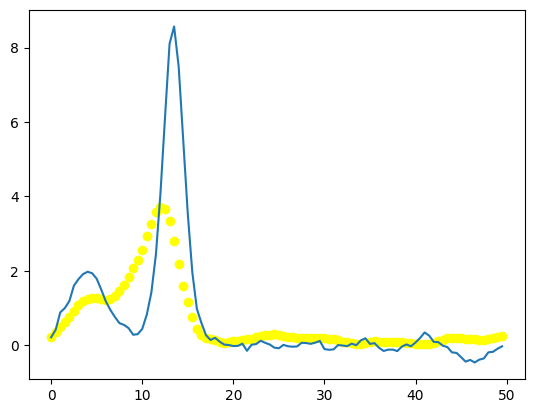

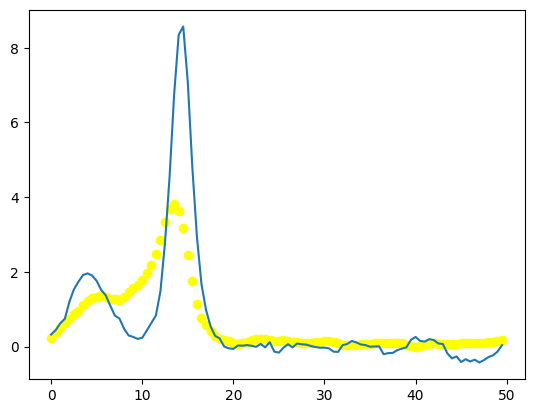

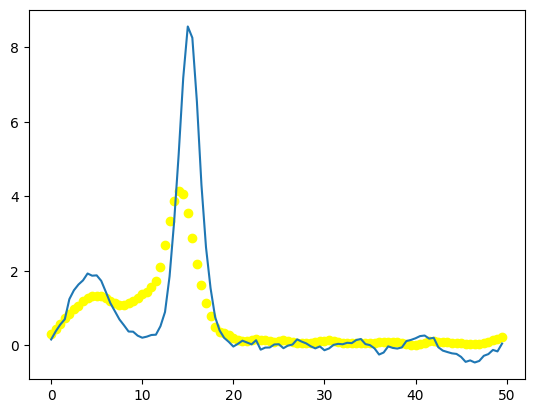

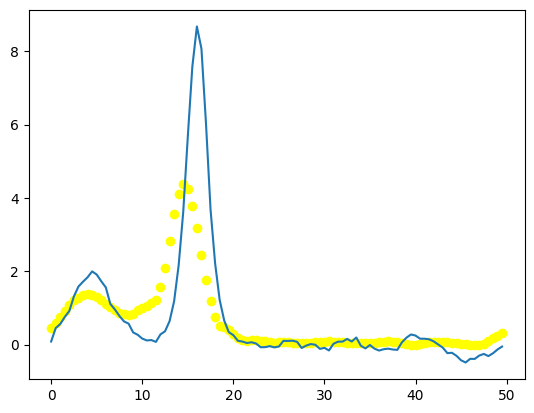

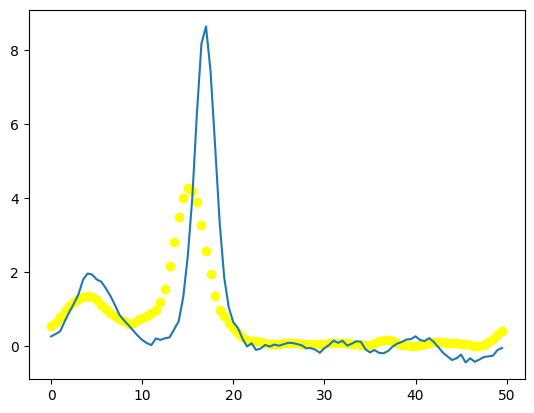

In [45]:
for j in range(5):
    plt.figure()
    plt.plot(ensf_y.cpu(), test_data_output[3][j].cpu().numpy(), label='true sol')
    plt.scatter(ensf_y.cpu(), s_preds[3][j], label='no DA', color='yellow')
    plt.show()


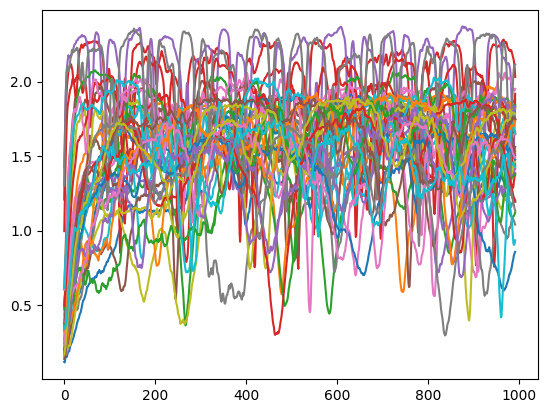

In [37]:
for i in range(len(rmse_temp_big)):
    plt.plot(np.linspace(0, len(rmse_temp_fifo), len(rmse_temp_fifo)), rmse_temp_big[i])

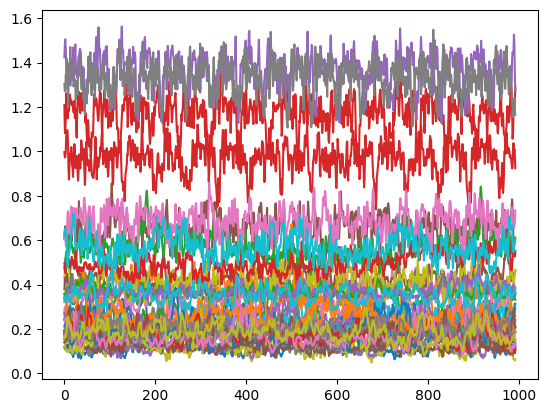

In [41]:
for i in range(len(NN_testing_rmse)):
    plt.plot(np.linspace(0, len(NN_testing_rmse_2), len(NN_testing_rmse_2)), NN_testing_rmse[i])

In [63]:
np.average(NN_testing_rmse)

np.float32(0.38244793)

In [64]:
NN_testing_rmse_2 = np.average(NN_testing_rmse, axis=0)

In [68]:
mse_avg_EnSF = np.loadtxt("rmse_all_acc_40.csv", delimiter=',')

In [69]:
mse_all = np.loadtxt("rmse_all_acc_EnKF_40.csv", delimiter=',')
mse_avg_EnKF = np.average(mse_all, axis=0)

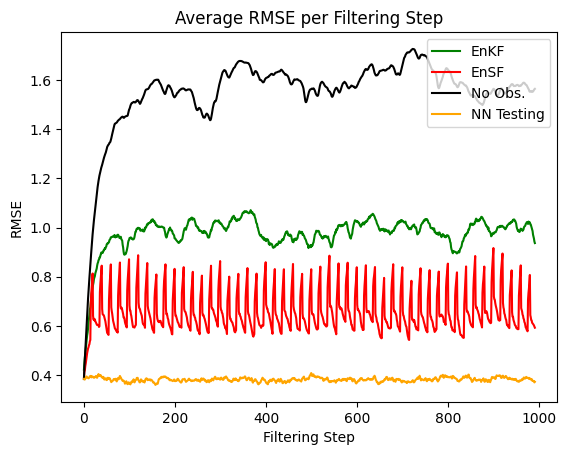

In [70]:
plt.plot(np.linspace(0, len(mse_avg_EnKF), len(mse_avg_EnKF)), mse_avg_EnKF, label="EnKF", color='green')
plt.plot(np.linspace(0, len(mse_avg_EnSF), len(mse_avg_EnSF)), mse_avg_EnSF, label="EnSF", color='red')
plt.plot(np.linspace(0, len(rmse_temp_fifo), len(rmse_temp_fifo)), np.average(rmse_temp_big, axis=0), label="No Obs.", color='black')
plt.plot(np.linspace(0, len(NN_testing_rmse_2), len(NN_testing_rmse_2)), NN_testing_rmse_2, label="NN Testing", color='orange')
plt.legend(loc='upper right')
plt.title("Average RMSE per Filtering Step")
plt.ylabel("RMSE")
plt.xlabel('Filtering Step')
plt.show()

In [ ]:
loss_fn = nn.MSELoss()

In [ ]:
loss_fn(torch.Tensor(np.array(y_state)).to(device), test_data_ensf)

tensor(0.4396, device='cuda:0')

# EnKF Insuff

In [71]:
model4.load_state_dict(torch.load('LSTM+DeepONet_5_3.pth', weights_only=True))
model4.eval()

DeepONet(
  (BranchNet): LSTMModel(
    (lstm): LSTM(100, 64, num_layers=3, batch_first=True)
    (fc): Linear(in_features=64, out_features=100, bias=True)
  )
  (TrunkLayers): ModuleList(
    (0): Linear(in_features=1, out_features=64, bias=True)
    (1): Linear(in_features=64, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=100, bias=True)
  )
  (relu): ReLU()
)

In [72]:
import ensemble_kalman_filter_LSTM
from ensemble_kalman_filter_LSTM import *

In [87]:
test_data_ensf = torch.tensor(test_data_output, dtype=torch.float32).to(device)

/tmp/ipykernel_4034564/2897839806.py:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_data_ensf = torch.tensor(test_data_output, dtype=torch.float32).to(device)


In [88]:
dim_x=100
N_step = 991
time_step = 1

ensemble_size = 100
obs_sigma = 0.1
forward_error = 0.05
model_inher =0.05 #just set it to approximately the same for now
obs_gap=20
consecutive_obs=15
device

'cuda'

In [75]:
def EnKF_forward_DeepONet(x_state, x_state_queue, dt):
    torch_x = torch.from_numpy(x_state).reshape([ensemble_size, 1, dim_x]).to(torch.float).to(device)
    torch_queue = torch.from_numpy(x_state_queue.reshape(ensemble_size, LSTM_seq_len-1, dim_x)).to(torch.float).to(device)
    #torch_queue = torch.from_numpy(x_state_queue.reshape(ensemble_size, LSTM_seq_len, dim_x)).to(torch.float).to(device)
    #next_t = model(torch.cat([torch_queue, torch_x], dim = 1)).detach().cpu().numpy()

    x_state_queue2 = torch.repeat_interleave(torch.cat([torch_queue, torch_x], dim = 1), num_y_test, dim=0)
    x_state = model4(x_state_queue2, ensf_y).reshape([ensemble_size, dim_x]).detach().cpu().numpy()
    #next_t = model(torch.cat([torch_queue, torch_x], dim = 1)).detach().cpu().numpy()

    return x_state

In [76]:
def hx_id(x):
    #return x/2
    return np.atan(x)

In [ ]:
x_state_queue = test_data_input[0][: LSTM_seq_len - 1].reshape((LSTM_seq_len-1, num_sensors))
initial_state =x_state_queue[-1].numpy()

ensf_y =torch.Tensor(np.tile(ytest2,  (ensemble_size,1))).to(device)
#x_state_queue = test_data_input[0].reshape((1,LSTM_seq_len, num_sensors))
#for i in range(ensemble_size-1):
    #x_state_queue=torch.cat((x_state_queue, test_data_input[0].reshape((1,LSTM_seq_len, num_sensors))), dim=0)

#initial_state =x_state_queue[-1][-1].numpy()

In [ ]:
np.shape(x_state_queue)

In [30]:
#initial_state = sol[LSTM_seq_len - 1]
#initial_queue = sol[: LSTM_seq_len - 1]
covariance_matrix = np.eye(dim_x) * 100
f = ensemble_kalman_filter_LSTM.EnsembleKalmanFilter(x = initial_state, P = covariance_matrix, dim_z = dim_x, dt = time_step,
                                                     N = ensemble_size, hx = hx_id, fx = EnKF_forward_DeepONet,
                                                     ensemble_size = ensemble_size, LSTM_seq_len = LSTM_seq_len,
                                                     x_queue = x_state_queue)

In [77]:
mse_all=[]

In [79]:
model4.eval().to(device)
for i in range(1):
    num_y_test =num_sensors
    ytest=np.linspace(0, (1-1.0/num_sensors)*L, num_sensors) #sensors are same as trunk net input
    ytest2 = np.reshape(ytest, (num_y_test, 1) )
    #u_test2 =np.repeat(test_data_input[i], num_y_test, axis=0)
    #y_test =np.tile(ytest2, (len(test_data_input[i]),1))
    
    #S_test= test_data_output[i].reshape((len(test_data_output[i])*len(test_data_output[i][0]),1))
    #testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net
    #testingY= torch.Tensor(np.array(y_test)).to(device) #sensors for operator, input to trunk
    #testingS = torch.Tensor(np.array(S_test)).to(device) #operator output at input y, (ie. numerical integral result)

    test_data_ensf = torch.tensor(test_data_output[i], dtype=torch.float32).to(device)
    x_state_queue = test_data_input[i][0][: LSTM_seq_len - 1].reshape((LSTM_seq_len-1, num_sensors))
    initial_state =x_state_queue[-1].numpy()

    ensf_y =torch.Tensor(np.tile(ytest2,  (ensemble_size,1))).to(device)
    covariance_matrix = np.eye(dim_x) * 100
    f = ensemble_kalman_filter_LSTM.EnsembleKalmanFilter(x = initial_state, P = covariance_matrix, dim_z = dim_x, dt = time_step,
                                                         N = ensemble_size, hx = hx_id, fx = EnKF_forward_DeepONet,
                                                         ensemble_size = ensemble_size, LSTM_seq_len = LSTM_seq_len,
                                                         x_queue = x_state_queue)


    f.R *= obs_sigma #** 2
    #f.Q *= (forward_error ** 2 + model_inher)
    f.Q *= forward_error #(forward_error  +model_inher)
    y_state = []
    rmse_temp = []
    for j in tqdm.tqdm(range(N_step)):
        #z = np.concatenate((np.zeros((LSTM_seq_len - 1) * dim_x), sol[i]), axis = None)
        #z = np.atan(sol[i]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)#MUST apply obs to true state, since not done in
        #z = sol[i]/2 + np.random.multivariate_normal(np.zeros(dim_x), f.R)
        if j % obs_gap == 0:
          do_obs = consecutive_obs
        if not(do_obs):
            z= None
        if do_obs:
            z = np.atan(test_data_output[i][j]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)
        f.predict()
        f.update(z)
        y_state.append(f.x[-dim_x: ])
        rmse_temp.append(torch.sqrt(torch.mean((torch.Tensor(y_state[-1]) - test_data_output[i][j]) ** 2)).item())
    y_state = np.array(y_state)
    mse_all.append(rmse_temp)

/tmp/ipykernel_4034564/2392513646.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_data_ensf = torch.tensor(test_data_output[i], dtype=torch.float32).to(device)
  0%|          | 0/991 [00:00<?, ?it/s]/tmp/ipykernel_4034564/2392513646.py:40: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  z = np.atan(test_data_output[i][j]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)
100%|██████████| 991/991 [00:57<00:00, 17.25it/s]


In [80]:
np.average(mse_all)

np.float64(0.9905406787886268)

In [123]:
np.average(mse_all)

np.float64(0.7794545035955884)

In [122]:
np.savetxt("y_state_insuff_EnKF.csv", y_state, delimiter=',')

In [123]:
y_state = np.loadtxt('y_state_insuff_EnKF.csv', delimiter=',')
x_states = np.loadtxt('x_states_Insuff_IC1.csv', delimiter=',')

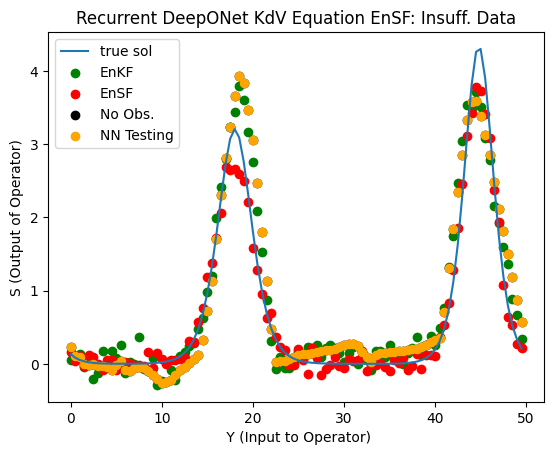

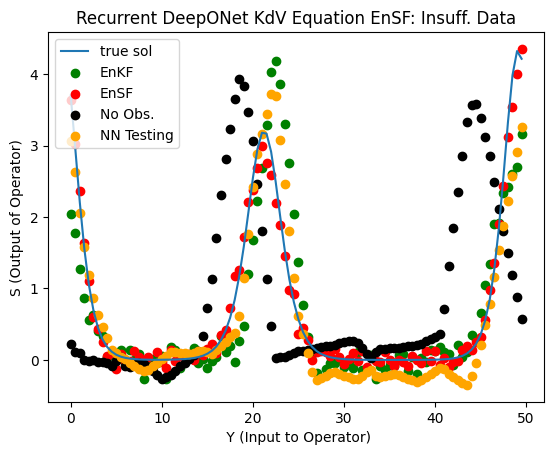

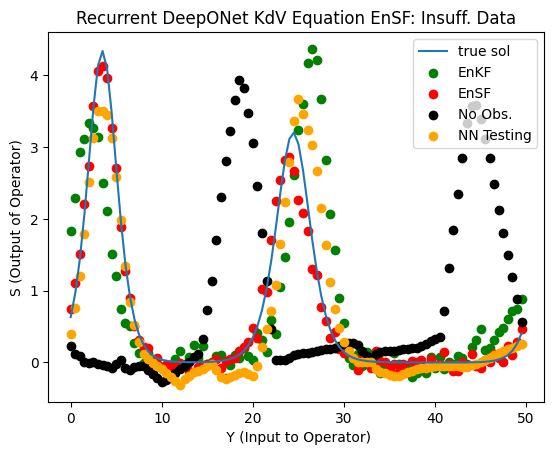

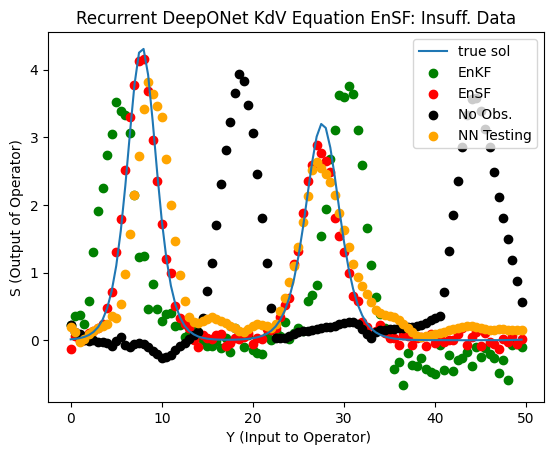

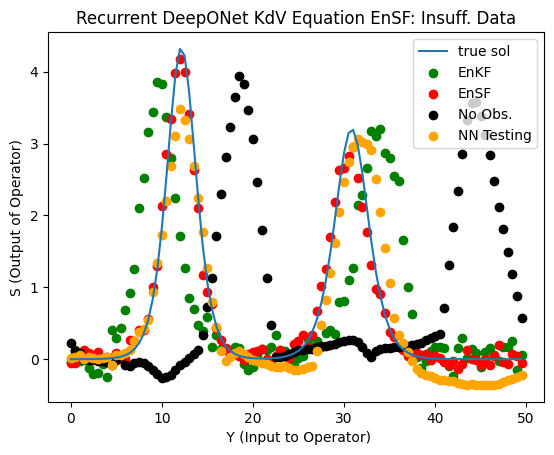

...

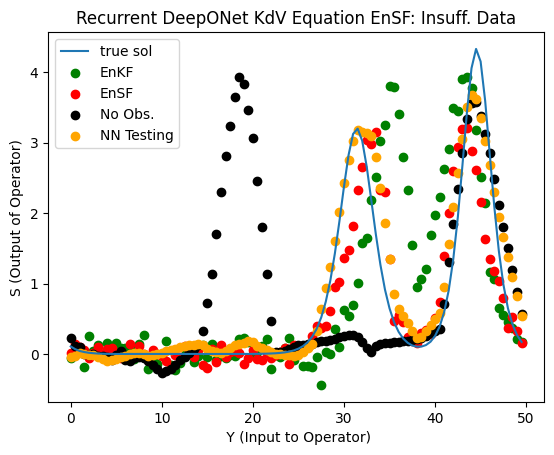

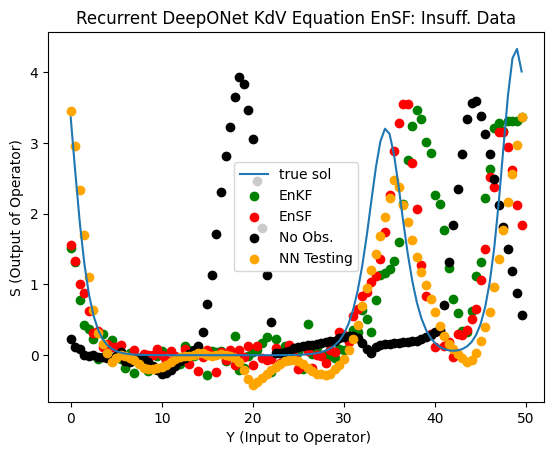

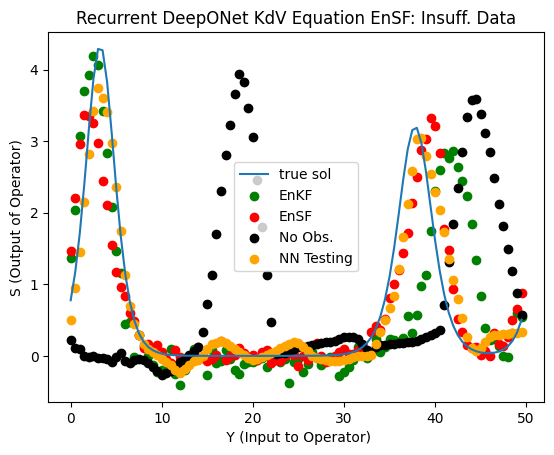

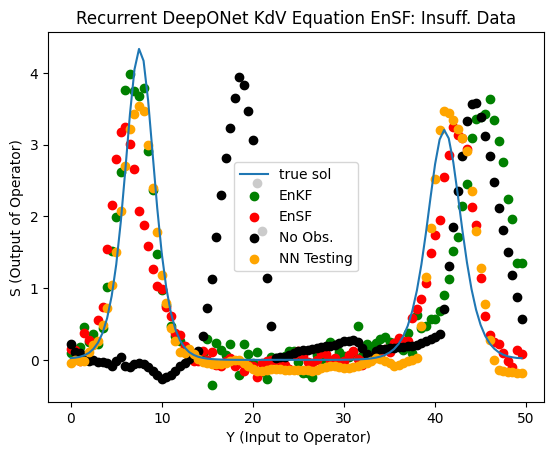

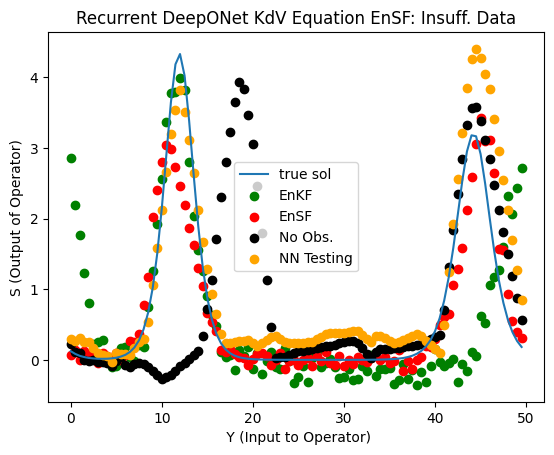

In [90]:
s_pred2 = s_pred.reshape(np.shape(x_states))
for n in range(60):
  plt.figure()
  plt.plot(ytest, test_data_ensf[0][n*10].cpu(), label='true sol')
  plt.scatter(ytest,y_state[n*10] , label='EnKF', color='green')
  plt.scatter(ytest, x_states[n*10], label='EnSF', color='red')
  plt.scatter(ytest, np.array(pred)[n*10], label='No Obs.', color='Black')
  plt.scatter(ytest, s_pred2[n*10], label='NN Testing', color='orange')
  plt.ylabel('S (Output of Operator)')
  plt.legend()
  plt.xlabel(' Y (Input to Operator)')
  plt.title('Recurrent DeepONet KdV Equation EnSF: Insuff. Data')
  plt.show()

In [91]:
model4.eval().to(device)
for i in range(40):
    num_y_test =num_sensors
    ytest=np.linspace(0, (1-1.0/num_sensors)*L, num_sensors) #sensors are same as trunk net input
    ytest2 = np.reshape(ytest, (num_y_test, 1) )
    #u_test2 =np.repeat(test_data_input[i], num_y_test, axis=0)
    #y_test =np.tile(ytest2, (len(test_data_input[i]),1))
    
    #S_test= test_data_output[i].reshape((len(test_data_output[i])*len(test_data_output[i][0]),1))
    #testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net
    #testingY= torch.Tensor(np.array(y_test)).to(device) #sensors for operator, input to trunk
    #testingS = torch.Tensor(np.array(S_test)).to(device) #operator output at input y, (ie. numerical integral result)

    test_data_ensf = torch.tensor(test_data_output[i], dtype=torch.float32).to(device)
    x_state_queue = test_data_input[i][0][: LSTM_seq_len - 1].reshape((LSTM_seq_len-1, num_sensors))
    initial_state =x_state_queue[-1].numpy()

    ensf_y =torch.Tensor(np.tile(ytest2,  (ensemble_size,1))).to(device)
    covariance_matrix = np.eye(dim_x) * 100
    f = ensemble_kalman_filter_LSTM.EnsembleKalmanFilter(x = initial_state, P = covariance_matrix, dim_z = dim_x, dt = time_step,
                                                         N = ensemble_size, hx = hx_id, fx = EnKF_forward_DeepONet,
                                                         ensemble_size = ensemble_size, LSTM_seq_len = LSTM_seq_len,
                                                         x_queue = x_state_queue)


    f.R *= obs_sigma #** 2
    #f.Q *= (forward_error ** 2 + model_inher)
    f.Q *= forward_error #(forward_error  +model_inher)
    y_state = []
    rmse_temp = []
    for j in tqdm.tqdm(range(N_step)):
        #z = np.concatenate((np.zeros((LSTM_seq_len - 1) * dim_x), sol[i]), axis = None)
        #z = np.atan(sol[i]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)#MUST apply obs to true state, since not done in
        #z = sol[i]/2 + np.random.multivariate_normal(np.zeros(dim_x), f.R)
        if j % obs_gap == 0:
          do_obs = consecutive_obs
        if not(do_obs):
            z= None
        if do_obs:
            z = np.atan(test_data_output[i][j]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)
        f.predict()
        f.update(z)
        y_state.append(f.x[-dim_x: ])
        rmse_temp.append(torch.sqrt(torch.mean((torch.Tensor(y_state[-1]) - test_data_output[i][j]) ** 2)).item())
    y_state = np.array(y_state)
    mse_all.append(rmse_temp)

/tmp/ipykernel_4034564/1521029687.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_data_ensf = torch.tensor(test_data_output[i], dtype=torch.float32).to(device)
  0%|          | 0/991 [00:00<?, ?it/s]/tmp/ipykernel_4034564/1521029687.py:40: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  z = np.atan(test_data_output[i][j]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)
100%|██████████| 991/991 [01:04<00:00, 15.43it/s]


In [93]:
np.savetxt("rmse_Insuff_DIFF_EnKF_40.csv", mse_all, delimiter=',')

In [94]:
np.average(mse_all)

np.float64(1.2464262880635224)

In [95]:
mse_avg_EnKF = np.average(mse_all, axis=0)

In [96]:
model4.eval().to(device)
rmse_temp_big=[]
for i in range(40):
    rmse_temp_fifo=[]
    pred=[]
    x_state_queue = test_data_input[i][0].reshape((1,LSTM_seq_len, num_sensors)).to(device)
    ensf_y =torch.Tensor(ytest2).to(device)
    for j in range(len(test_data_input[0])):
      if i !=0:
         x_state_queue = torch.cat((x_state_queue[:, 1:LSTM_seq_len, :], x_state.reshape((1,1,num_sensors))), dim=1)

      x_state_queue2 = torch.repeat_interleave(x_state_queue, num_y_test, dim=0)

      x_state = model4(x_state_queue2, ensf_y).detach()
      rmse_temp_fifo.append(torch.sqrt(torch.mean((x_state.detach().cpu() - test_data_output[i][j].unsqueeze(dim=-1)) ** 2)).item())
      #x_state = x_state + torch.randn_like(x_state) * 0.1
      pred.append(x_state.cpu().numpy())
      #x_state = x_state + torch.randn_like(x_state) * 0.1
    rmse_temp_big.append(rmse_temp_fifo)

In [97]:
np.average(rmse_temp_big)

np.float64(1.6583672069419104)

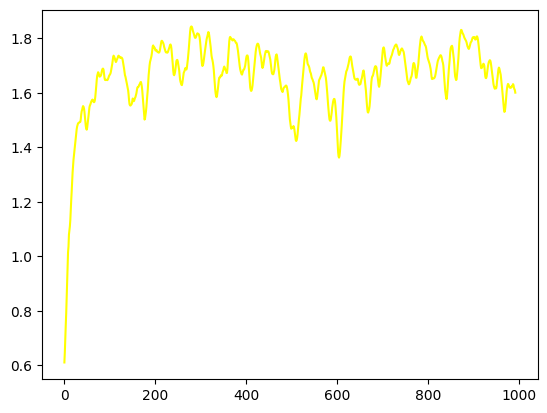

In [79]:
plt.plot(np.linspace(0, len(rmse_temp_fifo), len(rmse_temp_fifo)), np.average(rmse_temp_big, axis=0), label="Pure FIFO", color='yellow')

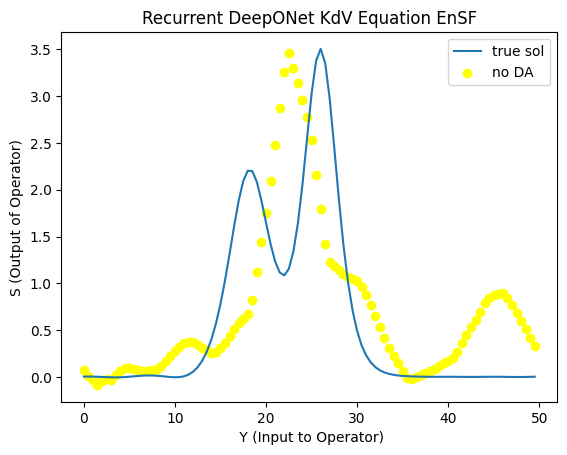

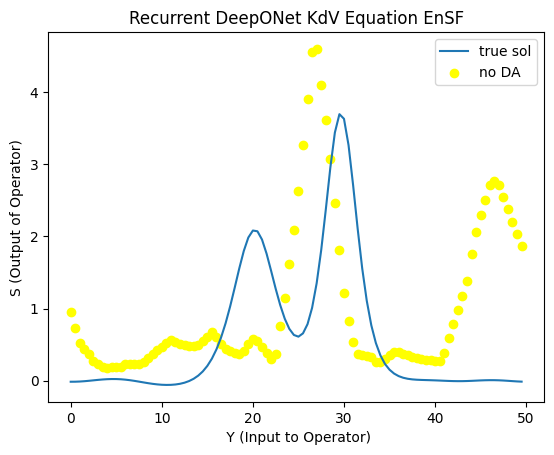

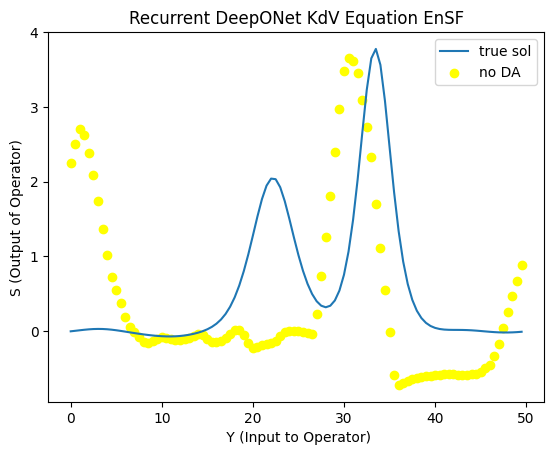

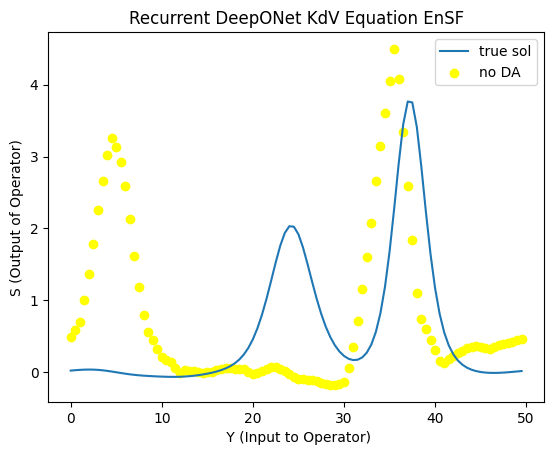

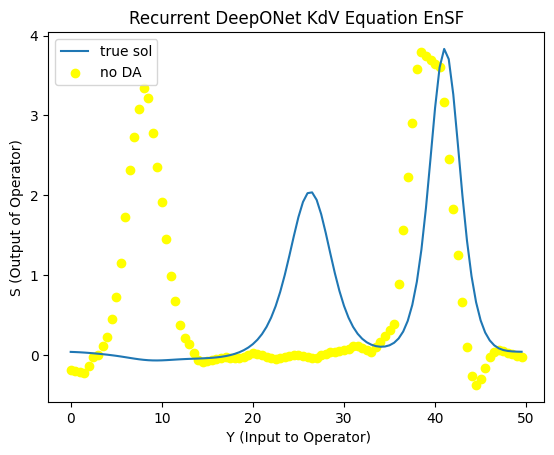

...

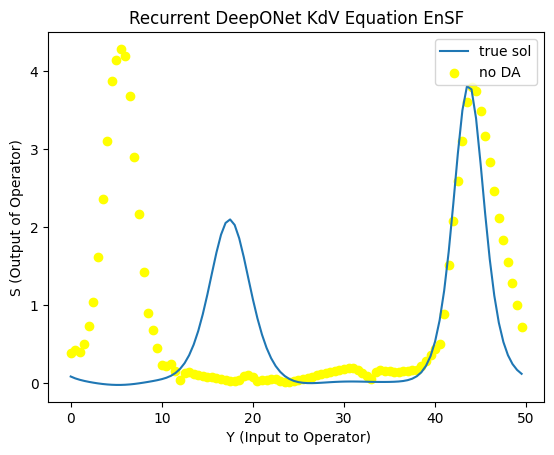

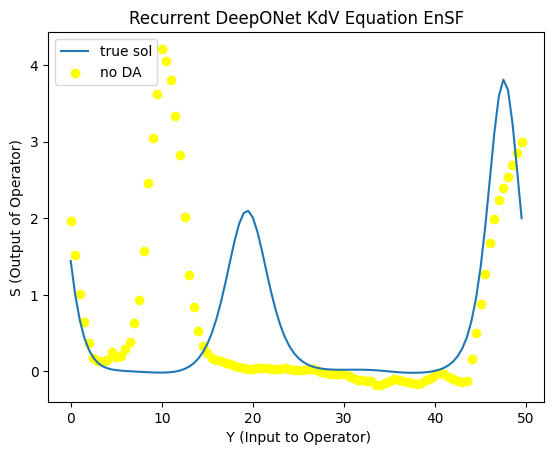

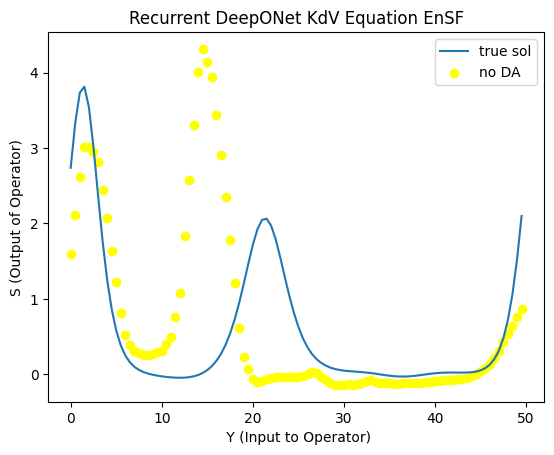

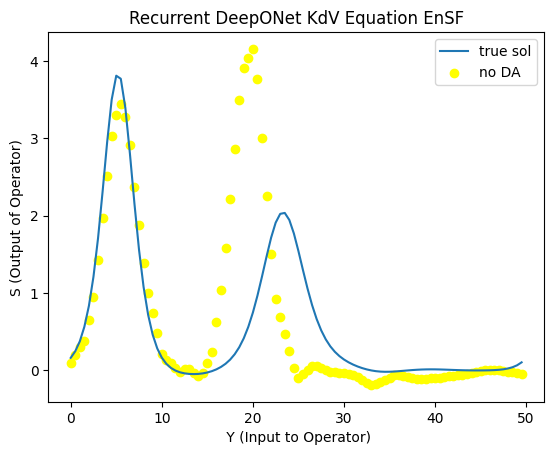

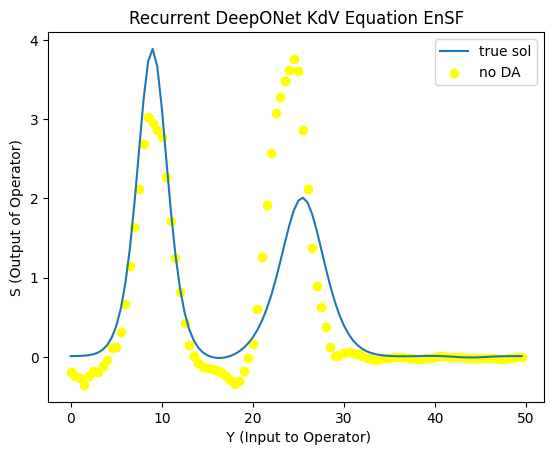

In [27]:
for n in range(60):
  plt.figure()
  plt.plot(ytest, test_data_ensf[9][n*10].cpu(), label='true sol')
  #plt.scatter(ytest,x_states[n*10] , label='EnSF', color='red')
  plt.scatter(ytest, np.array(pred)[n*10], label='no DA', color='yellow')
  #plt.scatter(ytest, x_ests[3*n], label='Post EnSF', color='orange')
  #plt.scatter(y_test, s_test[n:n+len(y_test)], color='red')
  plt.ylabel('S (Output of Operator)')
  plt.legend()
  plt.xlabel(' Y (Input to Operator)')
  plt.title('Recurrent DeepONet KdV Equation EnSF')
  plt.show()

In [98]:
model4.eval().cpu()
NN_testing_rmse = []
num_y_test =num_sensors
ytest=np.linspace(0, (1-1.0/num_sensors)*L, num_sensors) #sensors are same as trunk net input
ytest2 = np.reshape(ytest, (num_y_test, 1) )

for i in range(40):
    u_test2 =np.repeat(test_data_input[i], num_y_test, axis=0)
    y_test =np.tile(ytest2, (len(test_data_input[i]),1))
    
    #S_test= test_data_output[i].reshape((len(test_data_output[i])*len(test_data_output[i][0]),1))
    testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net
    testingY= torch.Tensor(np.array(y_test)).to(device) #sensors for operator, input to trunk
    #testingS = torch.Tensor(np.array(S_test)).to(device) #operator output at input y, (ie. numerical integral result)
    s_pred = model4(testingUx.cpu(), testingY.cpu()).detach().cpu().reshape(991, 100)
    NN_testing_rmse.append(torch.sqrt(torch.mean((s_pred - test_data_output[i]) ** 2, axis=1)))

/tmp/ipykernel_4034564/1004438718.py:12: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net


In [99]:
np.average(NN_testing_rmse)

np.float32(0.5173527)

In [100]:
NN_testing_rmse_2 = np.average(NN_testing_rmse, axis=0)

In [104]:
mse_avg_EnSF = np.loadtxt("rmse_all_insuff_40_2.csv", delimiter=',')

In [102]:
mse_all = np.loadtxt("rmse_Insuff_DIFF_EnKF_40.csv", delimiter=',')
mse_avg_EnKF = np.average(mse_all, axis=0)

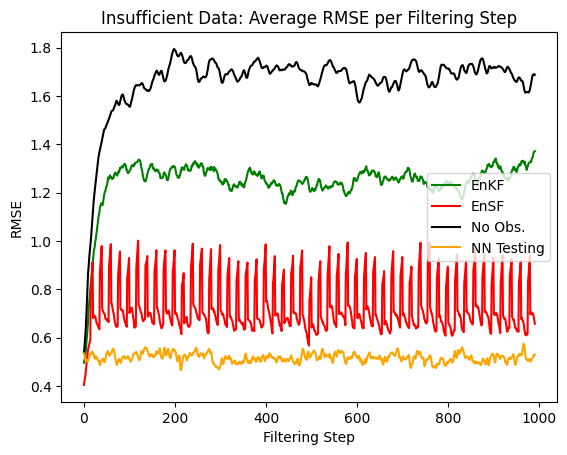

In [106]:
plt.plot(np.linspace(0, len(mse_avg_EnKF), len(mse_avg_EnKF)), mse_avg_EnKF, label="EnKF", color='green')
plt.plot(np.linspace(0, len(mse_avg_EnSF), len(mse_avg_EnSF)), mse_avg_EnSF, label="EnSF", color='red')
plt.plot(np.linspace(0, len(rmse_temp_fifo), len(rmse_temp_fifo)), np.average(rmse_temp_big, axis=0), label="No Obs.", color='black')
plt.plot(np.linspace(0, len(NN_testing_rmse_2), len(NN_testing_rmse_2)), NN_testing_rmse_2, label="NN Testing", color='orange')
plt.legend(loc='right')
plt.title("Insufficient Data: Average RMSE per Filtering Step")
plt.ylabel("RMSE")
plt.xlabel('Filtering Step')
plt.show()

# EnKF Noisy

In [15]:
model4.load_state_dict(torch.load('LSTM+DeepONet_thirtyIC_noisy.pth', weights_only=True))
model4.eval()

DeepONet(
  (BranchNet): LSTMModel(
    (lstm): LSTM(100, 64, num_layers=3, batch_first=True)
    (fc): Linear(in_features=64, out_features=100, bias=True)
  )
  (TrunkLayers): ModuleList(
    (0): Linear(in_features=1, out_features=64, bias=True)
    (1): Linear(in_features=64, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=100, bias=True)
  )
  (relu): ReLU()
)

In [16]:
import ensemble_kalman_filter_LSTM
from ensemble_kalman_filter_LSTM import *

In [17]:
test_data_ensf = torch.tensor(test_data_output, dtype=torch.float32).to(device)

/tmp/ipykernel_74397/2897839806.py:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_data_ensf = torch.tensor(test_data_output, dtype=torch.float32).to(device)


In [18]:
dim_x=100
N_step = 991
time_step = 1

ensemble_size = 100
obs_sigma = 0.1
forward_error = 0.05
model_inher =0.05 #just set it to approximately the same for now


obs_gap=20
consecutive_obs=15
device

'cuda'

In [19]:
def EnKF_forward_DeepONet(x_state, x_state_queue, dt):
    torch_x = torch.from_numpy(x_state).reshape([ensemble_size, 1, dim_x]).to(torch.float).to(device)
    torch_queue = torch.from_numpy(x_state_queue.reshape(ensemble_size, LSTM_seq_len-1, dim_x)).to(torch.float).to(device)
    #torch_queue = torch.from_numpy(x_state_queue.reshape(ensemble_size, LSTM_seq_len, dim_x)).to(torch.float).to(device)
    #next_t = model(torch.cat([torch_queue, torch_x], dim = 1)).detach().cpu().numpy()

    x_state_queue2 = torch.repeat_interleave(torch.cat([torch_queue, torch_x], dim = 1), num_y_test, dim=0)
    x_state = model4(x_state_queue2, ensf_y).reshape([ensemble_size, dim_x]).detach().cpu().numpy()
    #next_t = model(torch.cat([torch_queue, torch_x], dim = 1)).detach().cpu().numpy()

    return x_state

In [20]:
def hx_id(x):
    #return x/2
    return np.atan(x)

In [25]:
mse_all=[]

In [132]:
model4.eval().to(device)
for i in range(1):
    num_y_test =num_sensors
    ytest=np.linspace(0, (1-1.0/num_sensors)*L, num_sensors) #sensors are same as trunk net input
    ytest2 = np.reshape(ytest, (num_y_test, 1) )
    #u_test2 =np.repeat(test_data_input[i], num_y_test, axis=0)
    #y_test =np.tile(ytest2, (len(test_data_input[i]),1))
    
    #S_test= test_data_output[i].reshape((len(test_data_output[i])*len(test_data_output[i][0]),1))
    #testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net
    #testingY= torch.Tensor(np.array(y_test)).to(device) #sensors for operator, input to trunk
    #testingS = torch.Tensor(np.array(S_test)).to(device) #operator output at input y, (ie. numerical integral result)

    test_data_ensf = torch.tensor(test_data_output[i], dtype=torch.float32).to(device)
    x_state_queue = test_data_input[i][0][: LSTM_seq_len - 1].reshape((LSTM_seq_len-1, num_sensors))
    initial_state =x_state_queue[-1].numpy()

    ensf_y =torch.Tensor(np.tile(ytest2,  (ensemble_size,1))).to(device)
    covariance_matrix = np.eye(dim_x) * 100
    f = ensemble_kalman_filter_LSTM.EnsembleKalmanFilter(x = initial_state, P = covariance_matrix, dim_z = dim_x, dt = time_step,
                                                         N = ensemble_size, hx = hx_id, fx = EnKF_forward_DeepONet,
                                                         ensemble_size = ensemble_size, LSTM_seq_len = LSTM_seq_len,
                                                         x_queue = x_state_queue)


    f.R *= obs_sigma #** 2
    #f.Q *= (forward_error ** 2 + model_inher)
    f.Q *= forward_error #(forward_error  +model_inher)
    y_state = []
    rmse_temp = []
    for j in tqdm.tqdm(range(N_step)):
        #z = np.concatenate((np.zeros((LSTM_seq_len - 1) * dim_x), sol[i]), axis = None)
        #z = np.atan(sol[i]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)#MUST apply obs to true state, since not done in
        #z = sol[i]/2 + np.random.multivariate_normal(np.zeros(dim_x), f.R)
        if j % obs_gap == 0:
          do_obs = consecutive_obs
        if not(do_obs):
            z= None
        if do_obs:
            z = np.atan(test_data_output[i][j]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)
        f.predict()
        f.update(z)
        y_state.append(f.x[-dim_x: ])
        rmse_temp.append(torch.sqrt(torch.mean((torch.Tensor(y_state[-1]) - test_data_output[i][j]) ** 2)).item())
    y_state = np.array(y_state)
    mse_all.append(rmse_temp)

/tmp/ipykernel_3059535/2392513646.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_data_ensf = torch.tensor(test_data_output[i], dtype=torch.float32).to(device)
  0%|          | 0/991 [00:00<?, ?it/s]/tmp/ipykernel_3059535/2392513646.py:40: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  z = np.atan(test_data_output[i][j]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)
100%|██████████| 991/991 [01:00<00:00, 16.43it/s]


In [133]:
np.savetxt("y_state_noisy_EnKF.csv", y_state, delimiter=',')

In [26]:
y_state = np.loadtxt('y_state_noisy_EnKF.csv', delimiter=',')
x_states = np.loadtxt('thirtyIC_xstates_noisy.csv', delimiter=',')

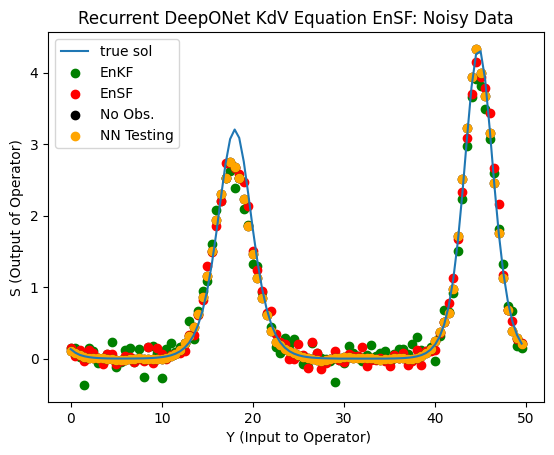

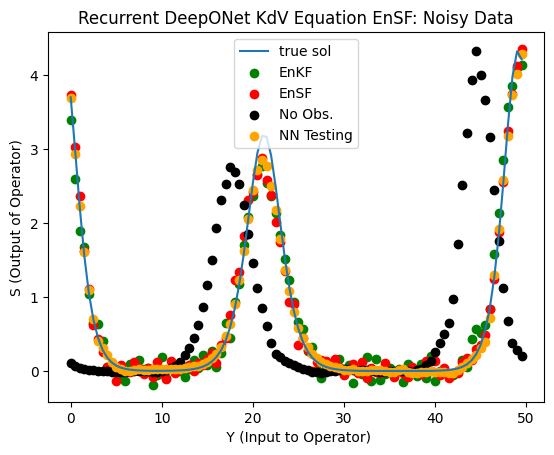

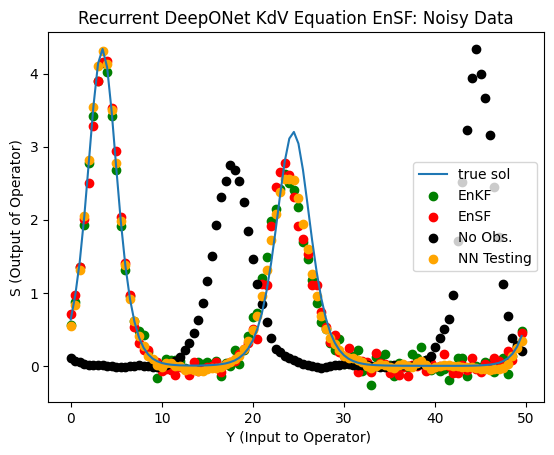

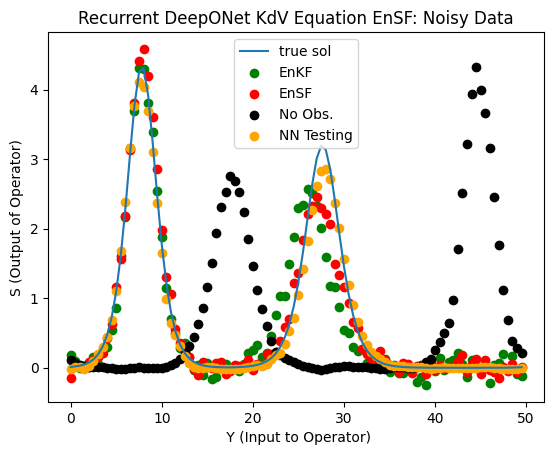

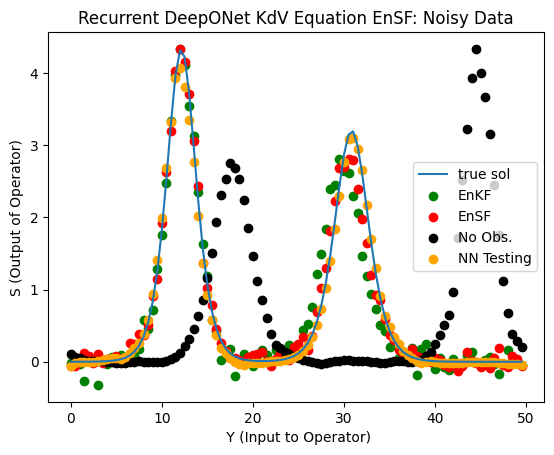

...

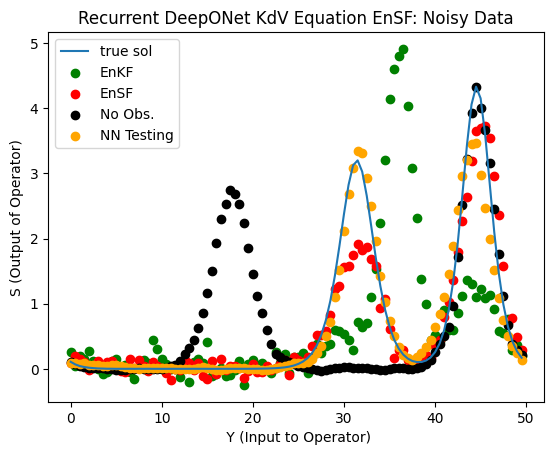

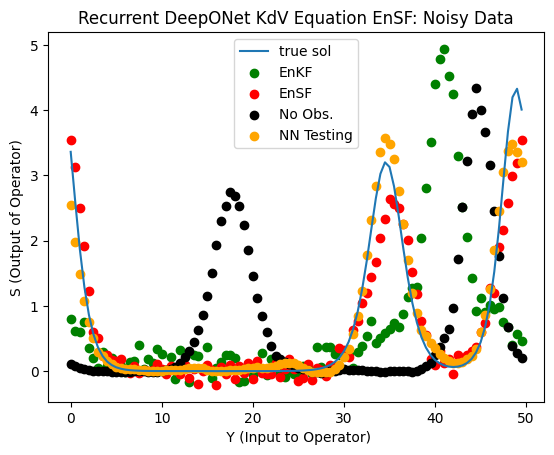

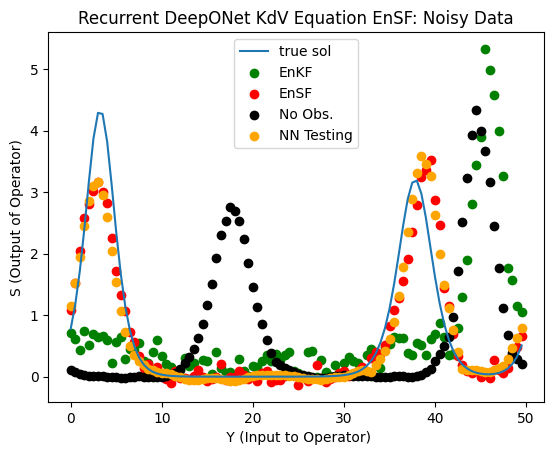

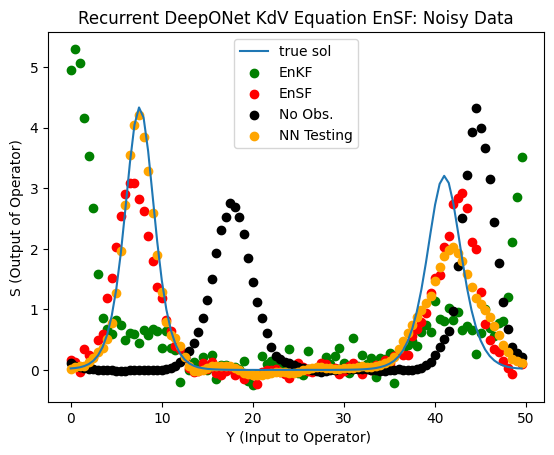

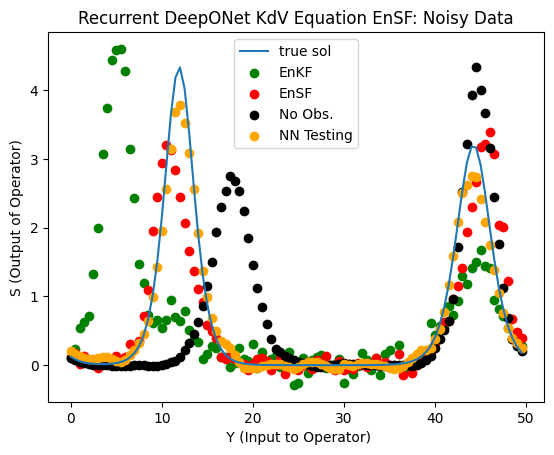

In [32]:
s_pred2 = s_pred.reshape(np.shape(x_states))
for n in range(60):
  plt.figure()
  plt.plot(ytest, test_data_ensf[0][n*10].cpu(), label='true sol')
  plt.scatter(ytest,y_state[n*10] , label='EnKF', color='green')
  plt.scatter(ytest, x_states[n*10], label='EnSF', color='red')
  plt.scatter(ytest, np.array(pred)[n*10], label='No Obs.', color='Black')
  plt.scatter(ytest, s_pred2[n*10], label='NN Testing', color='orange')
  plt.ylabel('S (Output of Operator)')
  plt.legend()
  plt.xlabel(' Y (Input to Operator)')
  plt.title('Recurrent DeepONet KdV Equation EnSF: Noisy Data')
  plt.show()

In [33]:
model4.eval().to(device)
for i in range(40):
    num_y_test =num_sensors
    ytest=np.linspace(0, (1-1.0/num_sensors)*L, num_sensors) #sensors are same as trunk net input
    ytest2 = np.reshape(ytest, (num_y_test, 1) )
    #u_test2 =np.repeat(test_data_input[i], num_y_test, axis=0)
    #y_test =np.tile(ytest2, (len(test_data_input[i]),1))
    
    #S_test= test_data_output[i].reshape((len(test_data_output[i])*len(test_data_output[i][0]),1))
    #testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net
    #testingY= torch.Tensor(np.array(y_test)).to(device) #sensors for operator, input to trunk
    #testingS = torch.Tensor(np.array(S_test)).to(device) #operator output at input y, (ie. numerical integral result)

    test_data_ensf = torch.tensor(test_data_output[i], dtype=torch.float32).to(device)
    x_state_queue = test_data_input[i][0][: LSTM_seq_len - 1].reshape((LSTM_seq_len-1, num_sensors))
    initial_state =x_state_queue[-1].numpy()

    ensf_y =torch.Tensor(np.tile(ytest2,  (ensemble_size,1))).to(device)
    covariance_matrix = np.eye(dim_x) * 100
    f = ensemble_kalman_filter_LSTM.EnsembleKalmanFilter(x = initial_state, P = covariance_matrix, dim_z = dim_x, dt = time_step,
                                                         N = ensemble_size, hx = hx_id, fx = EnKF_forward_DeepONet,
                                                         ensemble_size = ensemble_size, LSTM_seq_len = LSTM_seq_len,
                                                         x_queue = x_state_queue)


    f.R *= obs_sigma #** 2
    #f.Q *= (forward_error ** 2 + model_inher)
    f.Q *= forward_error #(forward_error  +model_inher)
    y_state = []
    rmse_temp = []
    for j in tqdm.tqdm(range(N_step)):
        #z = np.concatenate((np.zeros((LSTM_seq_len - 1) * dim_x), sol[i]), axis = None)
        #z = np.atan(sol[i]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)#MUST apply obs to true state, since not done in
        #z = sol[i]/2 + np.random.multivariate_normal(np.zeros(dim_x), f.R)
        if j % obs_gap == 0:
          do_obs = consecutive_obs
        if not(do_obs):
            z= None
        if do_obs:
            z = np.atan(test_data_output[i][j]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)
        f.predict()
        f.update(z)
        y_state.append(f.x[-dim_x: ])
        rmse_temp.append(torch.sqrt(torch.mean((torch.Tensor(y_state[-1]) - test_data_output[i][j]) ** 2)).item())
    y_state = np.array(y_state)
    mse_all.append(rmse_temp)

/tmp/ipykernel_74397/1521029687.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_data_ensf = torch.tensor(test_data_output[i], dtype=torch.float32).to(device)
  0%|          | 0/991 [00:00<?, ?it/s]/tmp/ipykernel_74397/1521029687.py:40: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  z = np.atan(test_data_output[i][j]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)
100%|██████████| 991/991 [01:02<00:00, 15.90it/s]


In [35]:
np.savetxt("rmse_Noisy_EnKF_40.csv", mse_all, delimiter=',')

In [36]:
mse_avg_EnKF = np.average(mse_all, axis=0)

In [37]:
np.average(mse_all)

np.float64(1.2148481753151996)

In [38]:
rmse_temp_big=[]
model4.to(device)
for i in range(40):
    rmse_temp_fifo=[]
    pred=[]
    x_state_queue = test_data_input[i][0].reshape((1,LSTM_seq_len, num_sensors)).to(device)
    ensf_y =torch.Tensor(ytest2).to(device)
    for j in range(len(test_data_input[0])):
      if i !=0:
         x_state_queue = torch.cat((x_state_queue[:, 1:LSTM_seq_len, :], x_state.reshape((1,1,num_sensors))), dim=1)

      x_state_queue2 = torch.repeat_interleave(x_state_queue, num_y_test, dim=0)

      x_state = model4(x_state_queue2, ensf_y).detach()
      rmse_temp_fifo.append(torch.sqrt(torch.mean((x_state.detach().cpu() - test_data_output[i][j].unsqueeze(dim=-1)) ** 2)).item())
      #x_state = x_state + torch.randn_like(x_state) * 0.1
      pred.append(x_state.cpu().numpy())
      #x_state = x_state + torch.randn_like(x_state) * 0.1
    rmse_temp_big.append(rmse_temp_fifo)

In [39]:
np.average(rmse_temp_big)

np.float64(1.5677190587037326)

In [40]:
model4.eval().cpu()
NN_testing_rmse = []
num_y_test =num_sensors
ytest=np.linspace(0, (1-1.0/num_sensors)*L, num_sensors) #sensors are same as trunk net input
ytest2 = np.reshape(ytest, (num_y_test, 1) )

for i in range(40):
    u_test2 =np.repeat(test_data_input[i], num_y_test, axis=0)
    y_test =np.tile(ytest2, (len(test_data_input[i]),1))
    
    #S_test= test_data_output[i].reshape((len(test_data_output[i])*len(test_data_output[i][0]),1))
    testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net
    testingY= torch.Tensor(np.array(y_test)).to(device) #sensors for operator, input to trunk
    #testingS = torch.Tensor(np.array(S_test)).to(device) #operator output at input y, (ie. numerical integral result)
    s_pred = model4(testingUx.cpu(), testingY.cpu()).detach().cpu().reshape(991, 100)
    NN_testing_rmse.append(torch.sqrt(torch.mean((s_pred - test_data_output[i]) ** 2, axis=1)))

/tmp/ipykernel_74397/1004438718.py:12: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net


In [41]:
np.average(NN_testing_rmse)

np.float32(0.39726582)

In [42]:
NN_testing_rmse_2 = np.average(NN_testing_rmse, axis=0)

In [44]:
mse_avg_EnSF = np.loadtxt("rmse_all_Noisy_40_2.csv", delimiter=',')

In [45]:
mse_all = np.loadtxt("rmse_Noisy_EnKF_40.csv", delimiter=',')
mse_avg_EnKF = np.average(mse_all, axis=0)

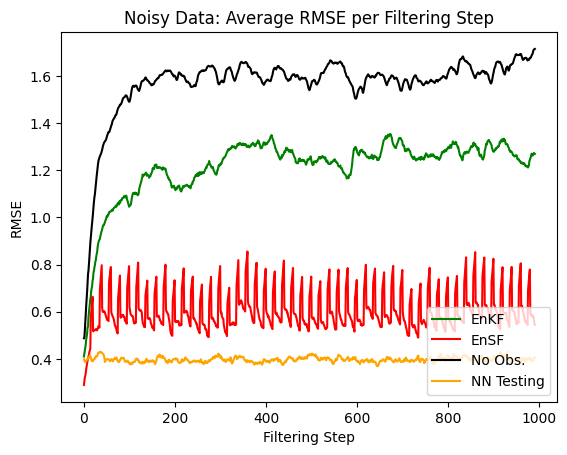

In [46]:
plt.plot(np.linspace(0, len(mse_avg_EnKF), len(mse_avg_EnKF)), mse_avg_EnKF, label="EnKF", color='green')
plt.plot(np.linspace(0, len(mse_avg_EnSF), len(mse_avg_EnSF)), mse_avg_EnSF, label="EnSF", color='red')
plt.plot(np.linspace(0, len(rmse_temp_fifo), len(rmse_temp_fifo)), np.average(rmse_temp_big, axis=0), label="No Obs.", color='black')
plt.plot(np.linspace(0, len(NN_testing_rmse_2), len(NN_testing_rmse_2)), NN_testing_rmse_2, label="NN Testing", color='orange')
plt.legend(loc='lower right')
plt.title("Noisy Data: Average RMSE per Filtering Step")
plt.ylabel("RMSE")
plt.xlabel('Filtering Step')
plt.show()

# EnKF Partial

In [16]:
model4.load_state_dict(torch.load('LSTM+DeepONet_thirtyIC.pth', weights_only=True))
model4.eval().to(device)

DeepONet(
  (BranchNet): LSTMModel(
    (lstm): LSTM(100, 64, num_layers=3, batch_first=True)
    (fc): Linear(in_features=64, out_features=100, bias=True)
  )
  (TrunkLayers): ModuleList(
    (0): Linear(in_features=1, out_features=64, bias=True)
    (1): Linear(in_features=64, out_features=100, bias=True)
    (2): Linear(in_features=100, out_features=100, bias=True)
  )
  (relu): ReLU()
)

In [17]:
import ensemble_kalman_filter_LSTM
from ensemble_kalman_filter_LSTM import *

In [19]:
dim_x=100
N_step = 991
time_step = 1

ensemble_size = 100
obs_sigma = 0.1
forward_error = 0.05
model_inher =0.05 #just set it to approximately the same for now

obs_state_num=25
obs_gap=20
consecutive_obs=15
device

'cuda'

In [20]:
def EnKF_forward_DeepONet(x_state, x_state_queue, dt):
    torch_x = torch.from_numpy(x_state).reshape([ensemble_size, 1, dim_x]).to(torch.float).to(device)
    torch_queue = torch.from_numpy(x_state_queue.reshape(ensemble_size, LSTM_seq_len-1, dim_x)).to(torch.float).to(device)
    #torch_queue = torch.from_numpy(x_state_queue.reshape(ensemble_size, LSTM_seq_len, dim_x)).to(torch.float).to(device)
    #next_t = model(torch.cat([torch_queue, torch_x], dim = 1)).detach().cpu().numpy()

    x_state_queue2 = torch.repeat_interleave(torch.cat([torch_queue, torch_x], dim = 1), num_y_test, dim=0)
    x_state = model4(x_state_queue2, ensf_y).reshape([ensemble_size, dim_x]).detach().cpu().numpy()
    #next_t = model(torch.cat([torch_queue, torch_x], dim = 1)).detach().cpu().numpy()

    return x_state

In [21]:
def hx_id(x):
    #return x/2
    return np.atan(x)

In [ ]:
x_state_queue = test_data_input[0][: LSTM_seq_len - 1].reshape((LSTM_seq_len-1, num_sensors))
initial_state =x_state_queue[-1].numpy()

ensf_y =torch.Tensor(np.tile(ytest2,  (ensemble_size,1))).to(device)
#x_state_queue = test_data_input[0].reshape((1,LSTM_seq_len, num_sensors))
#for i in range(ensemble_size-1):
    #x_state_queue=torch.cat((x_state_queue, test_data_input[0].reshape((1,LSTM_seq_len, num_sensors))), dim=0)

#initial_state =x_state_queue[-1][-1].numpy()

In [ ]:
#initial_state = sol[LSTM_seq_len - 1]
#initial_queue = sol[: LSTM_seq_len - 1]
covariance_matrix = np.eye(dim_x) * 100
f = ensemble_kalman_filter_LSTM.EnsembleKalmanFilter(x = initial_state, P = covariance_matrix, dim_z = dim_x, dt = time_step,
                                                     N = ensemble_size, hx = hx_id, fx = EnKF_forward_DeepONet,
                                                     ensemble_size = ensemble_size, LSTM_seq_len = LSTM_seq_len,
                                                     x_queue = x_state_queue)

In [22]:
mse_all=[]

In [23]:
for i in range(40):
    num_y_test =num_sensors
    ytest=np.linspace(0, (1-1.0/num_sensors)*L, num_sensors) #sensors are same as trunk net input
    ytest2 = np.reshape(ytest, (num_y_test, 1) )
    #u_test2 =np.repeat(test_data_input[i], num_y_test, axis=0)
    #y_test =np.tile(ytest2, (len(test_data_input[i]),1))
    
    #S_test= test_data_output[i].reshape((len(test_data_output[i])*len(test_data_output[i][0]),1))
    #testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net
    #testingY= torch.Tensor(np.array(y_test)).to(device) #sensors for operator, input to trunk
    #testingS = torch.Tensor(np.array(S_test)).to(device) #operator output at input y, (ie. numerical integral result)

    test_data_ensf = torch.tensor(test_data_output[i], dtype=torch.float32).to(device)
    x_state_queue = test_data_input[i][0][: LSTM_seq_len - 1].reshape((LSTM_seq_len-1, num_sensors))
    initial_state =x_state_queue[-1].numpy()

    ensf_y =torch.Tensor(np.tile(ytest2,  (ensemble_size,1))).to(device)
    covariance_matrix = np.eye(dim_x) * 100
    f = ensemble_kalman_filter_LSTM.EnsembleKalmanFilter(x = initial_state, P = covariance_matrix, dim_z = dim_x, dt = time_step,
                                                         N = ensemble_size, hx = hx_id, fx = EnKF_forward_DeepONet,
                                                         ensemble_size = ensemble_size, LSTM_seq_len = LSTM_seq_len,
                                                         x_queue = x_state_queue)


    f.R *= obs_sigma #** 2
    #f.Q *= (forward_error ** 2 + model_inher)
    f.Q *= forward_error #(forward_error  +model_inher)
    y_state = []
    rmse_temp = []
    for j in tqdm.tqdm(range(N_step)):
        #z = np.concatenate((np.zeros((LSTM_seq_len - 1) * dim_x), sol[i]), axis = None)
        #z = np.atan(sol[i]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)#MUST apply obs to true state, since not done in
        #z = sol[i]/2 + np.random.multivariate_normal(np.zeros(dim_x), f.R)
        f.predict()
        if j % obs_gap == 0:
          do_obs = consecutive_obs
        if not(do_obs):
            z= None
        if do_obs:
            z = np.atan(test_data_output[i][j]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)
            non_obs_states = np.random.choice(dim_x, size = dim_x - obs_state_num, replace = False)
            z[non_obs_states] = torch.Tensor(np.atan(f.x[non_obs_states])).to(torch.float64)
        f.update(z)
        y_state.append(f.x[-dim_x: ])
        rmse_temp.append(torch.sqrt(torch.mean((torch.Tensor(y_state[-1]) - test_data_output[i][j]) ** 2)).item())
    y_state = np.array(y_state)
    mse_all.append(rmse_temp)

/tmp/ipykernel_3479847/3469425687.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  test_data_ensf = torch.tensor(test_data_output[i], dtype=torch.float32).to(device)
  0%|          | 0/991 [00:00<?, ?it/s]/tmp/ipykernel_3479847/3469425687.py:40: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  z = np.atan(test_data_output[i][j]) + np.random.multivariate_normal(np.zeros(dim_x), f.R)
100%|██████████| 991/991 [01:02<00:00, 15.88it/s]


In [50]:
np.shape(mse_all)

(10, 991)

In [24]:
np.savetxt("rmse_all_40_EnKF_Partial.csv", mse_all, delimiter=',')

In [25]:
mse_all = np.loadtxt("rmse_all_40_EnKF_Partial.csv", delimiter=',')

In [26]:
mse_avg_EnKF = np.average(mse_all, axis=0)

In [27]:
np.average(mse_all)

np.float64(1.4459968277904478)

In [55]:
ytest2 = np.reshape(ytest, (num_y_test, 1) )

In [28]:
model4.eval().to(device)
rmse_temp_big=[]
for i in range(numICtest):
    rmse_temp_fifo=[]
    pred=[]
    x_state_queue = test_data_input[i][0].reshape((1,LSTM_seq_len, num_sensors)).to(device)
    #print(np.shape(x_state_queue))
    #ensf_y = torch.Tensor(np.tile(ytest2,  (ensemble_size,1))).to(device)
    ensf_y =torch.Tensor(ytest2).to(device)
    for j in range(len(test_data_input[0])):
      if j !=0:
         x_state_queue = torch.cat((x_state_queue[:, 1:LSTM_seq_len, :], x_state.reshape((1,1,num_sensors))), dim=1)

      x_state_queue2 = torch.repeat_interleave(x_state_queue, num_y_test, dim=0)
      x_state = model4(x_state_queue2, ensf_y).detach()
      #plt.figure()
      #plt.plot(ensf_y.cpu(), test_data_output[i][j].cpu().numpy(), label='true sol')
      #plt.scatter(ensf_y.cpu(), x_state.cpu(), label='no DA', color='yellow')
     # plt.show()

      rmse_temp_fifo.append(torch.sqrt(torch.mean((x_state.detach().cpu() - test_data_output[i][j].unsqueeze(dim=-1)) ** 2)).item())
      #x_state = x_state + torch.randn_like(x_state) * 0.1
      pred.append(x_state.cpu().numpy())
      #x_state = x_state + torch.randn_like(x_state) * 0.1
    rmse_temp_big.append(rmse_temp_fifo)

In [29]:
np.average(rmse_temp_big)

np.float64(1.5501821375281881)

In [30]:
model4.eval().cpu()
NN_testing_rmse = []
num_y_test =num_sensors
ytest=np.linspace(0, (1-1.0/num_sensors)*L, num_sensors) #sensors are same as trunk net input
ytest2 = np.reshape(ytest, (num_y_test, 1) )
s_preds = []

for i in range(40):
    u_test2 =np.repeat(test_data_input[i], num_y_test, axis=0)
    y_test =np.tile(ytest2, (len(test_data_input[i]),1))
    
    #S_test= test_data_output[i].reshape((len(test_data_output[i])*len(test_data_output[i][0]),1))
    testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net
    testingY= torch.Tensor(np.array(y_test)).to(device) #sensors for operator, input to trunk
    #testingS = torch.Tensor(np.array(S_test)).to(device) #operator output at input y, (ie. numerical integral result)
    s_pred = model4(testingUx.cpu(), testingY.cpu()).detach().cpu().reshape(991, 100)
    s_preds.append(s_pred)
    #print(np.shape(s_pred))
    NN_testing_rmse.append(torch.sqrt(torch.mean((s_pred - test_data_output[i]) ** 2, axis=1)))

/tmp/ipykernel_3479847/1312587332.py:13: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  testingUx = torch.Tensor(np.array(u_test2)).to(device) #functions, input into branch net


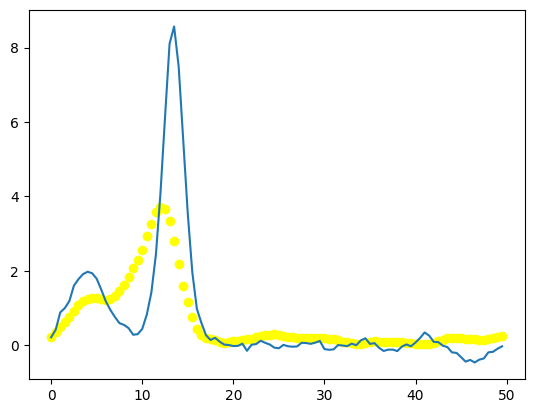

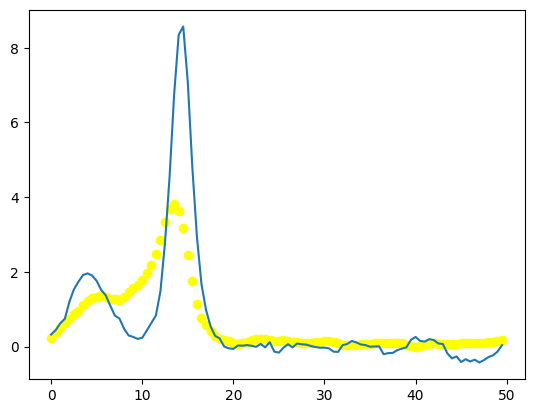

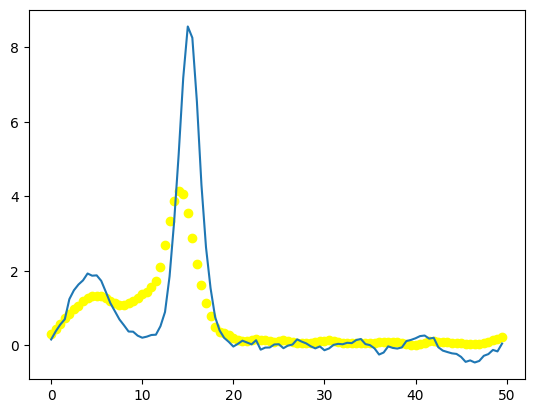

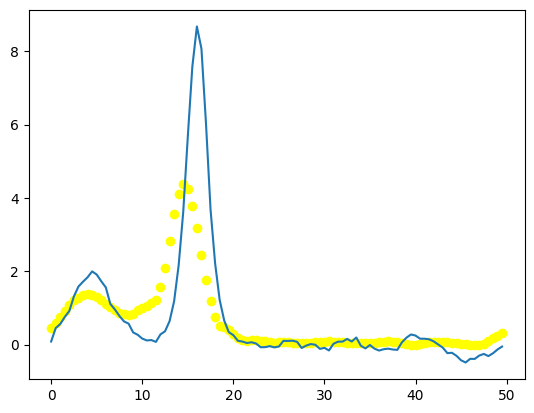

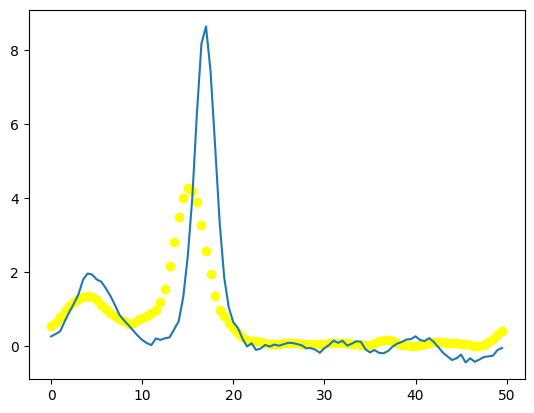

In [45]:
for j in range(5):
    plt.figure()
    plt.plot(ensf_y.cpu(), test_data_output[3][j].cpu().numpy(), label='true sol')
    plt.scatter(ensf_y.cpu(), s_preds[3][j], label='no DA', color='yellow')
    plt.show()


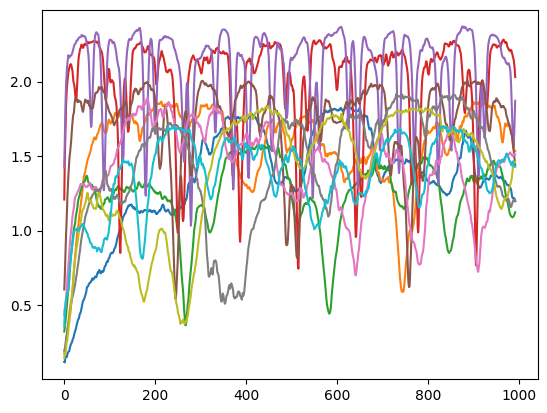

In [62]:
for i in range(len(rmse_temp_big)):
    plt.plot(np.linspace(0, len(rmse_temp_fifo), len(rmse_temp_fifo)), rmse_temp_big[i])

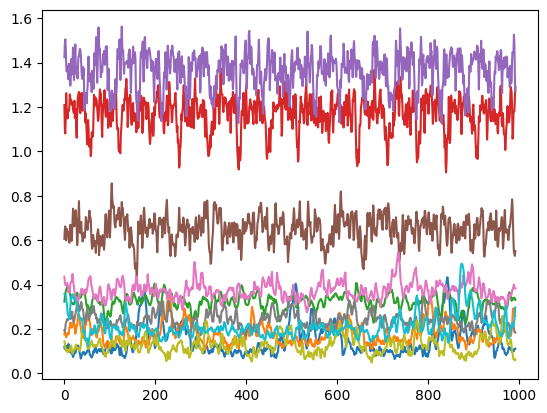

In [65]:
for i in range(len(NN_testing_rmse)):
    plt.plot(np.linspace(0, len(NN_testing_rmse_2), len(NN_testing_rmse_2)), NN_testing_rmse[i])

In [33]:
np.average(NN_testing_rmse)

np.float32(0.38244793)

In [34]:
NN_testing_rmse_2 = np.average(NN_testing_rmse, axis=0)

In [36]:
mse_avg_EnSF = np.loadtxt("rmse_all_40_Partial_EnSF_2.csv", delimiter=',')

In [37]:
mse_all = np.loadtxt("rmse_all_40_EnKF_Partial.csv", delimiter=',')
mse_avg_EnKF = np.average(mse_all, axis=0)

In [ ]:
mse_avg_EnSF_2 = np.loadtxt("rmse_all_EnSF_40.csv", delimiter=',')
mse_all2 = np.loadtxt("rmse_all_acc_EnKF_40.csv", delimiter=',')
mse_avg_EnKF2 = np.average(mse_all2, axis=0)

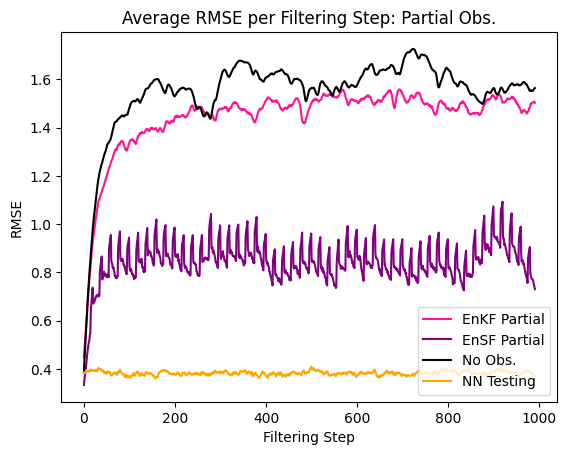

In [45]:
plt.plot(np.linspace(0, len(mse_avg_EnKF), len(mse_avg_EnKF)), mse_avg_EnKF, label="EnKF Partial", color='deeppink')
plt.plot(np.linspace(0, len(mse_avg_EnSF), len(mse_avg_EnSF)), mse_avg_EnSF, label="EnSF Partial", color='purple')
#plt.plot(np.linspace(0, len(mse_avg_EnKF), len(mse_avg_EnKF)), mse_avg_EnKF2, label="EnKF", color='green')
#plt.plot(np.linspace(0, len(mse_avg_EnSF), len(mse_avg_EnSF)), mse_avg_EnSF_2, label="EnSF", color='red')
plt.plot(np.linspace(0, len(rmse_temp_fifo), len(rmse_temp_fifo)), np.average(rmse_temp_big, axis=0), label="No Obs.", color='black')
plt.plot(np.linspace(0, len(NN_testing_rmse_2), len(NN_testing_rmse_2)), NN_testing_rmse_2, label="NN Testing", color='orange')
plt.legend(loc='lower right')
plt.title("Average RMSE per Filtering Step: Partial Obs.")
plt.ylabel("RMSE")
plt.xlabel('Filtering Step')
plt.show()

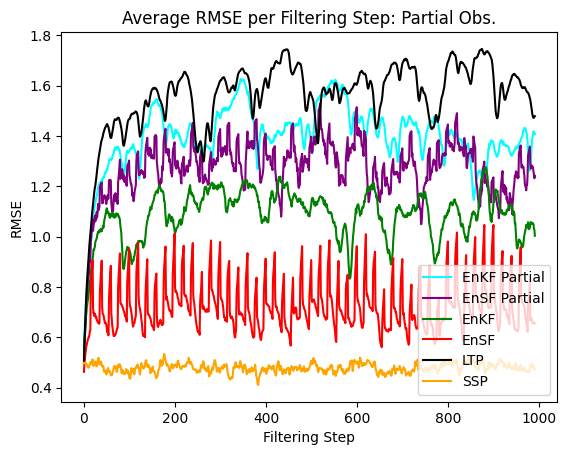

In [73]:
plt.plot(np.linspace(0, len(mse_avg_EnKF), len(mse_avg_EnKF)), mse_avg_EnKF, label="EnKF Partial", color='aqua')
plt.plot(np.linspace(0, len(mse_avg_EnSF), len(mse_avg_EnSF)), mse_avg_EnSF, label="EnSF Partial", color='purple')
plt.plot(np.linspace(0, len(mse_avg_EnKF), len(mse_avg_EnKF)), mse_avg_EnKF2, label="EnKF", color='green')
plt.plot(np.linspace(0, len(mse_avg_EnSF), len(mse_avg_EnSF)), mse_avg_EnSF_2, label="EnSF", color='red')
plt.plot(np.linspace(0, len(rmse_temp_fifo), len(rmse_temp_fifo)), np.average(rmse_temp_big, axis=0), label="LTP", color='black')
plt.plot(np.linspace(0, len(NN_testing_rmse_2), len(NN_testing_rmse_2)), NN_testing_rmse_2, label="SSP", color='orange')
plt.legend()
plt.title("Average RMSE per Filtering Step: Partial Obs.")
plt.ylabel("RMSE")
plt.xlabel('Filtering Step')
plt.show()